# Capstone : Sales Forecasting

<i>Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores.</i>

## Steps :-

1. Data Loading, Data Cleaning and Data Merging
2. Exploratory Data Analysis
3. Outlier Detection and Removing
4. Modeling 
  1.   Missing Data handling
  2.   Time Series Decomposition
  3.   Stationary Check and making data Stationary
  4.   ACF and PACF
  5.   Train-Test Split
  6.   Modeling and Hyper-Parameter Tuning
  7.   Cointegration - Johansen Test
  6.   Impulse Response Function




In [1]:
# Importing necessary Libraries

import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import math

from pylab import rcParams
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from sklearn.preprocessing import MinMaxScaler

In [2]:
# Importing Data/Files from Google Drive
# Note for Reviewer : Below code will change for you as per the location of Data/Files in your system/drive

from google.colab import drive
drive.mount('/content/gdrive')

root_path = '/content/gdrive/My Drive/Upgrad/Capstone'


Mounted at /content/gdrive


In [3]:
train = pd.read_csv(root_path + "/train.csv")
store = pd.read_csv(root_path + "/store.csv")


# Below code will be used if Data/Files are located in local system
# train = pd.read_csv("train.csv")
# store = pd.read_csv("store.csv")

In [4]:
train.head().append(train.tail())

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1
1017208,1115,2,2013-01-01,0,0,0,0,a,1


In [5]:
store.head().append(store.tail())

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
1110,1111,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN
1114,1115,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"


### Filtering Data for 9 Stores -  1,3,8,9,13,25,29,31 and 46.

In [6]:
train = train[train['Store'].isin([1,3,8,9,13,25,29,31,46])]
store = store[store['Store'].isin([1,3,8,9,13,25,29,31,46])]

In [7]:
train.shape, store.shape

((8110, 9), (9, 10))

### Data Cleaning

In [8]:
# checking for null values

train.isnull().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

In [9]:
store.isnull().sum()

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    2
CompetitionOpenSinceYear     2
Promo2                       0
Promo2SinceWeek              6
Promo2SinceYear              6
PromoInterval                6
dtype: int64

- Few columns in Store are having null values, let's deal with them first

In [10]:
store.describe()

,Store,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
count,9.000000,9.000000,7.000000,7.000000,9.000000,3.000000,3.000000
mean,18.333333,4317.777778,8.428571,2006.857143,0.333333,24.333333,2010.333333
std,15.173991,4957.597144,2.507133,4.913538,0.500000,17.897858,1.154701
min,1.000000,310.000000,4.000000,2000.000000,0.000000,14.000000,2009.000000
25%,8.000000,1200.000000,7.500000,2004.000000,0.000000,14.000000,2010.000000
50%,13.000000,2030.000000,9.000000,2006.000000,0.000000,14.000000,2011.000000
75%,29.000000,7520.000000,9.500000,2010.000000,1.000000,29.500000,2011.000000
max,46.000000,14130.000000,12.000000,2014.000000,1.000000,45.000000,2011.000000


In [11]:
store.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9 entries, 0 to 45
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      9 non-null      int64  
 1   StoreType                  9 non-null      object 
 2   Assortment                 9 non-null      object 
 3   CompetitionDistance        9 non-null      float64
 4   CompetitionOpenSinceMonth  7 non-null      float64
 5   CompetitionOpenSinceYear   7 non-null      float64
 6   Promo2                     9 non-null      int64  
 7   Promo2SinceWeek            3 non-null      float64
 8   Promo2SinceYear            3 non-null      float64
 9   PromoInterval              3 non-null      object 
dtypes: float64(5), int64(2), object(3)
memory usage: 792.0+ bytes


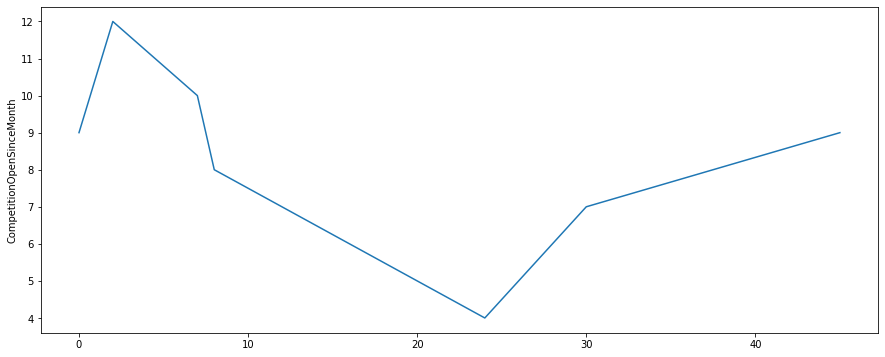

In [12]:
fig,ax = plt.subplots(figsize=(15,6))
sns.lineplot(y=store['CompetitionOpenSinceMonth'],x=store.index)
plt.show()

In [13]:
print("Column CompetitionOpenSinceMonth : \n")
print("Mean : ",int(store['CompetitionOpenSinceMonth'].mean()))
print("Median :",int(store['CompetitionOpenSinceMonth'].median()))
print("Mode :",int(store['CompetitionOpenSinceMonth'].mode()))


Column CompetitionOpenSinceMonth : 

Mean :  8
Median : 9
Mode : 9


***CompetitionOpenSinceMonth*** : We will impute this column with it's Mode, because this is representing a month of the year and I think taking the most frequent month is a better way to proceed intuitively <br>

Similarly, for ***CompetitionOpenSinceYear*** we will impute null values with it's Mode

In [14]:
store['CompetitionOpenSinceMonth'].fillna(int(store['CompetitionOpenSinceMonth'].mode()),inplace=True)

store['CompetitionOpenSinceYear'].fillna(int(store['CompetitionOpenSinceYear'].mode()[0]),inplace=True)

In [15]:
store.isnull().sum()

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              6
Promo2SinceYear              6
PromoInterval                6
dtype: int64

In [16]:
store[(store['Promo2SinceWeek'].isnull()) & (store['Promo2SinceYear'].isnull()) & (store['PromoInterval'].isnull()) & (store['Promo2']==0)]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
7,8,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
8,9,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
24,25,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
28,29,d,c,2170.0,9.0,2000.0,0,NaN,NaN,NaN
30,31,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN


- It is noted that the stores that have Promo2 as 0 value, value of ***Promo2SinceWeek & Promo2SinceYear & PromoInterval*** are NaN, it simply means that those stores never have Promo2 offer, so we will replace all NaN values with 0

In [17]:
store['Promo2SinceWeek'].fillna(0,inplace=True)
store['Promo2SinceYear'].fillna(0,inplace=True)
store['PromoInterval'].fillna(0,inplace=True)

In [18]:
store.isnull().sum()

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

#### Finally, all Null Values are handled and our data is clean now

### Data Preprocessing : Part 1

- Let us merge the data from Train and Test set into a single dataset

In [19]:
master_ds = pd.merge(train, store, on='Store')

In [20]:
master_ds.isnull().sum()

Store                        0
DayOfWeek                    0
Date                         0
Sales                        0
Customers                    0
Open                         0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

In [21]:
# converting Date column into Datetime datatype

master_ds['Date'] = pd.to_datetime(master_ds['Date'],format='%Y-%m-%d')

In [22]:
master_ds.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0


In [23]:
master_ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 8109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Store                      8110 non-null   int64         
 1   DayOfWeek                  8110 non-null   int64         
 2   Date                       8110 non-null   datetime64[ns]
 3   Sales                      8110 non-null   int64         
 4   Customers                  8110 non-null   int64         
 5   Open                       8110 non-null   int64         
 6   Promo                      8110 non-null   int64         
 7   StateHoliday               8110 non-null   object        
 8   SchoolHoliday              8110 non-null   int64         
 9   StoreType                  8110 non-null   object        
 10  Assortment                 8110 non-null   object        
 11  CompetitionDistance        8110 non-null   float64       
 12  Compet

- Now, our data is in single DataFrame and we are ready for EDA

### Exploratory Data Analysis

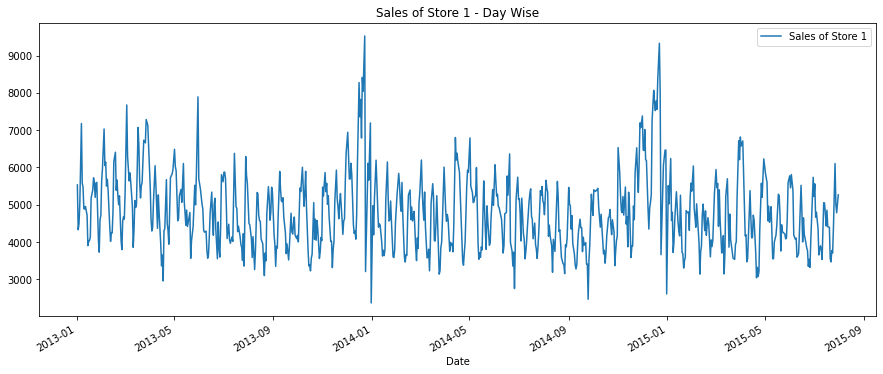

In [24]:
store_1 = master_ds[(master_ds['Sales']>0) & (master_ds['Store']==1)][['Date','Sales']]
store_1.set_index('Date',inplace=True)

fig = store_1.plot(figsize=(15,6),title='Sales of Store 1 - Day Wise')
plt.legend(labels=['Sales of Store 1'])
plt.show()

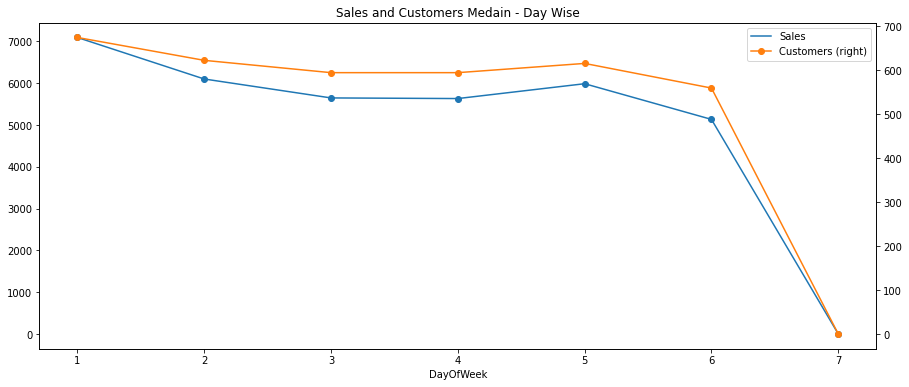

In [25]:
# ploting median Sales and Customers for each day of the week

median_sales_daywise = master_ds.groupby('DayOfWeek')['Sales'].median()
median_customers_daywise = master_ds.groupby('DayOfWeek')['Customers'].median()

fig,ax = plt.subplots(figsize=(15,6))
fig = median_sales_daywise.plot(marker='o',legend=True)
#fig = sns.lineplot(y=median_sales_daywise,x=median_sales_daywise.index,marker='o')
#fig = sns.lineplot(y=median_customers_daywise,x=median_customers_daywise.index,marker='o')
plt.legend(labels=['Sales','Customers'])
ax.set(ylabel='', xlabel='Day of Week', title='Sales and Customers Medain - Day Wise')
fig = median_customers_daywise.plot(marker='o',secondary_y=True,legend=True)
plt.show()

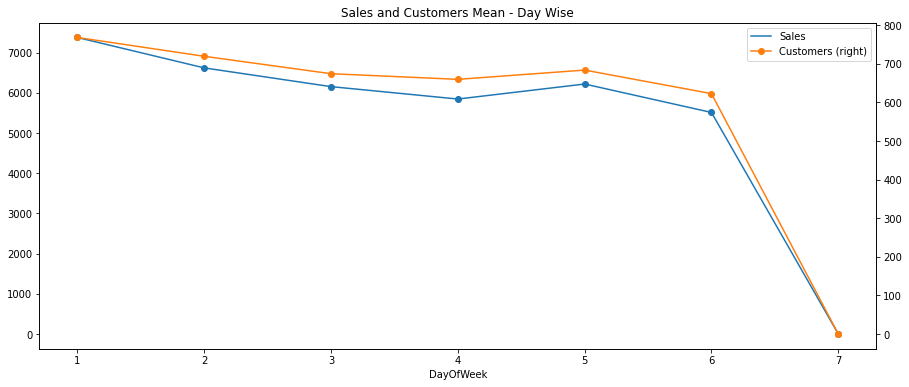

In [26]:
# ploting mean Sales and Customers for each day of the week

mean_sales_daywise = master_ds.groupby('DayOfWeek')['Sales'].mean()
mean_customers_daywise = master_ds.groupby('DayOfWeek')['Customers'].mean()

fig,ax = plt.subplots(figsize=(15,6))
fig = mean_sales_daywise.plot(marker='o',legend=True)
plt.legend(labels=['Sales','Customers'])
#sns.lineplot(y=mean_sales_daywise,x=mean_sales_daywise.index,marker='o')
#sns.lineplot(y=mean_customers_daywise,x=mean_customers_daywise.index,marker='o')
ax.set(ylabel='', xlabel='Day of Week', title='Sales and Customers Mean - Day Wise')
fig = mean_customers_daywise.plot(marker='o',secondary_y=True,legend=True)
plt.show()

In [27]:
# ploting mean Sales and Customers for each day of the week

master_ds_copy = master_ds
master_ds_copy['Month'] = master_ds_copy['Date'].apply(lambda x: x.month)
master_ds_copy['Year'] = master_ds_copy['Date'].apply(lambda x: x.year)
master_ds_copy['MonthYear'] = master_ds_copy['Date'].apply(lambda x: str(x.month) + '-' + str(x.year))




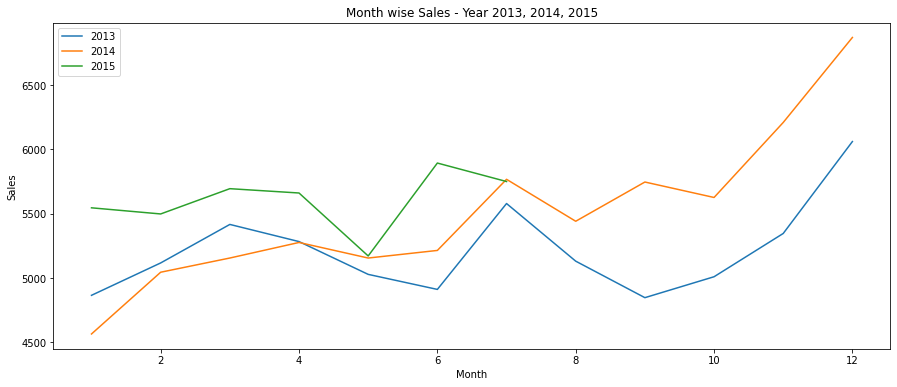

In [28]:
mean_sales_monthwise = master_ds_copy.groupby(['Year','Month'])['Sales'].mean()

fig,ax = plt.subplots(figsize=(15,6))
mean_sales_monthwise.unstack().T.plot(ax=ax)
plt.legend(labels=['2013','2014','2015'])
ax.set(ylabel='Sales', xlabel='Month', title='Month wise Sales - Year 2013, 2014, 2015')
plt.show()

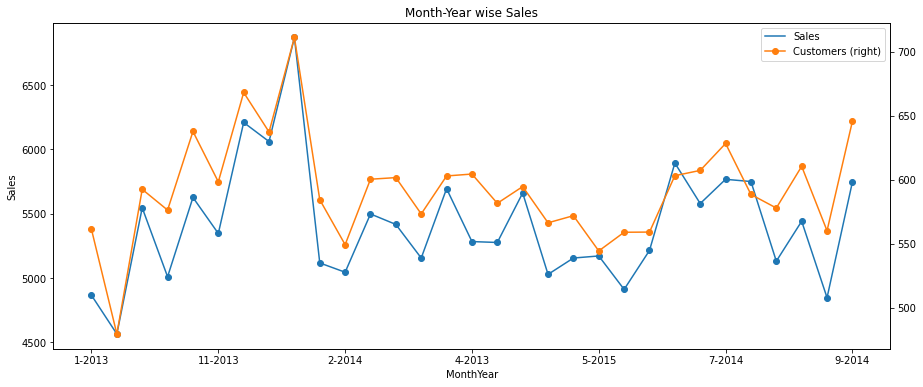

In [29]:
mean_sales_monthwise = master_ds_copy.groupby(['MonthYear'])['Sales'].mean()
mean_cust_monthwise = master_ds_copy.groupby(['MonthYear'])['Customers'].mean()

fig,ax = plt.subplots(figsize=(15,6))
fig = mean_sales_monthwise.plot(marker='o',legend=True)
ax.set(ylabel='Sales', xlabel='Month-Year', title='Month-Year wise Sales')
fig = mean_cust_monthwise.plot(marker='o',secondary_y=True,legend=True)
plt.show()

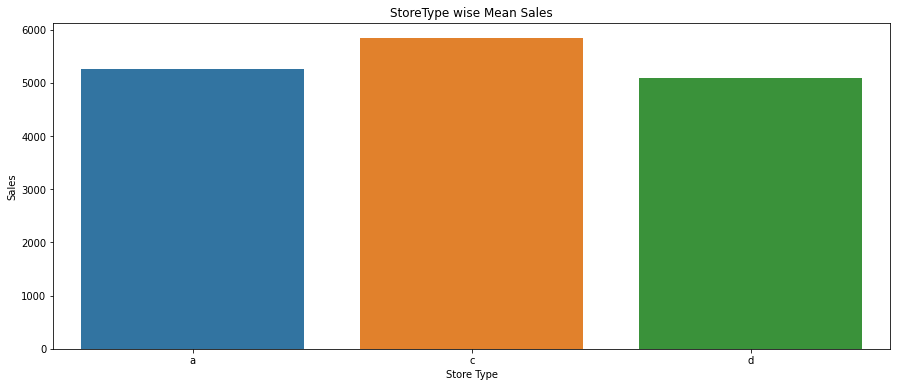

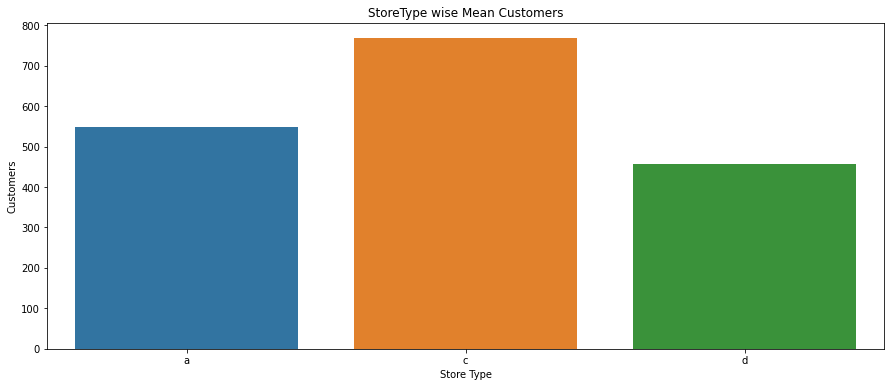

In [30]:
mean_sales_monthwise = master_ds_copy.groupby(['StoreType'])['Sales'].mean()
mean_cust_monthwise = master_ds_copy.groupby(['StoreType'])['Customers'].mean()

fig,ax = plt.subplots(figsize=(15,6))
fig = sns.barplot(y=mean_sales_monthwise,x=mean_sales_monthwise.index)
ax.set(ylabel='Sales', xlabel='Store Type', title='StoreType wise Mean Sales')
plt.show()

fig,ax = plt.subplots(figsize=(15,6))
fig = sns.barplot(y=mean_cust_monthwise,x=mean_cust_monthwise.index)
ax.set(ylabel='Customers', xlabel='Store Type', title='StoreType wise Mean Customers')
plt.show()

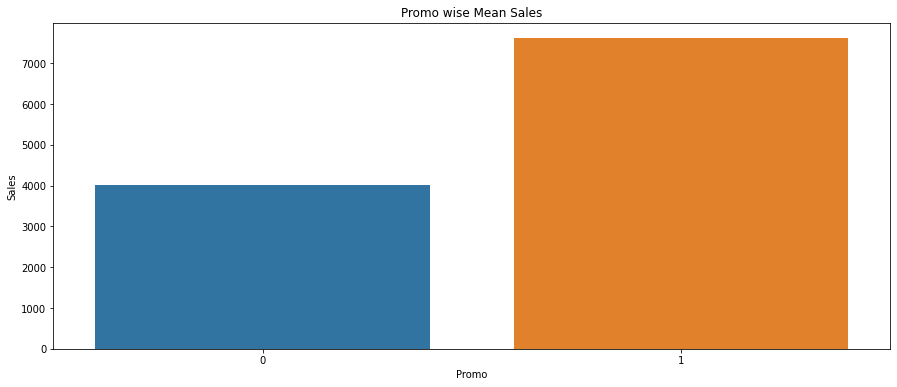

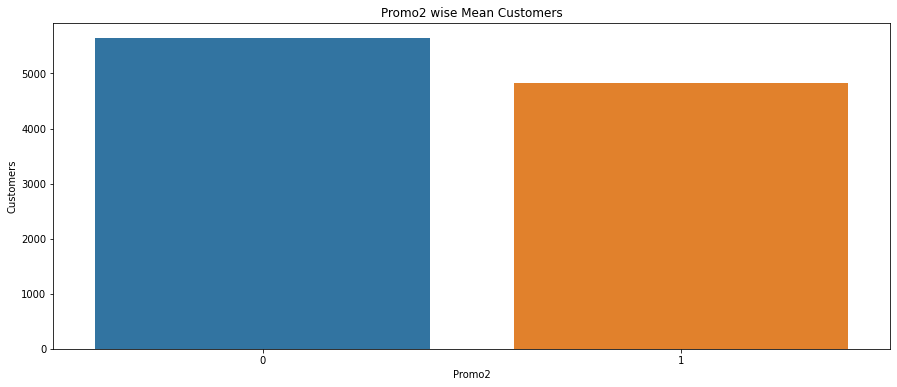

In [31]:
mean_sales_monthwise = master_ds_copy.groupby(['Promo'])['Sales'].mean()
mean_cust_monthwise = master_ds_copy.groupby(['Promo2'])['Sales'].mean()

fig,ax = plt.subplots(figsize=(15,6))
fig = sns.barplot(y=mean_sales_monthwise,x=mean_sales_monthwise.index)
ax.set(ylabel='Sales', xlabel='Promo', title='Promo wise Mean Sales')
plt.show()

fig,ax = plt.subplots(figsize=(15,6))
fig = sns.barplot(y=mean_cust_monthwise,x=mean_cust_monthwise.index)
ax.set(ylabel='Customers', xlabel='Promo2', title='Promo2 wise Mean Customers')
plt.show()

In [32]:
master_ds_copy['SchoolHoliday'].value_counts()

0    6671
1    1439
Name: SchoolHoliday, dtype: int64

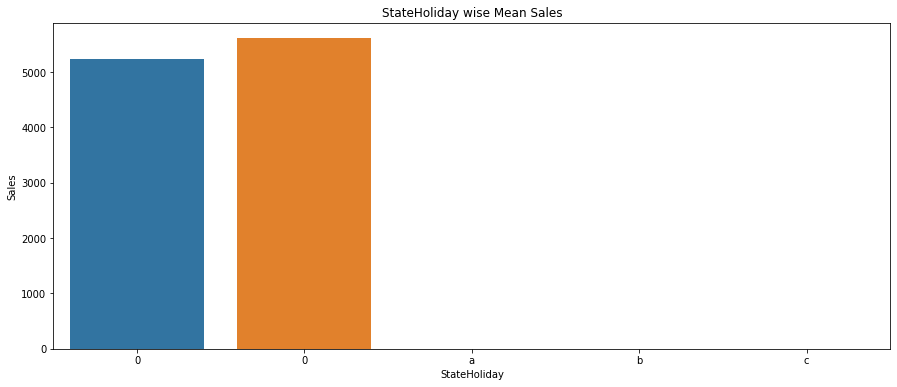

In [33]:
mean_sales_monthwise = master_ds_copy.groupby(['StateHoliday'])['Sales'].mean()

fig,ax = plt.subplots(figsize=(15,6))
fig = sns.barplot(y=mean_sales_monthwise,x=mean_sales_monthwise.index)
ax.set(ylabel='Sales', xlabel='StateHoliday', title='StateHoliday wise Mean Sales')
plt.show()

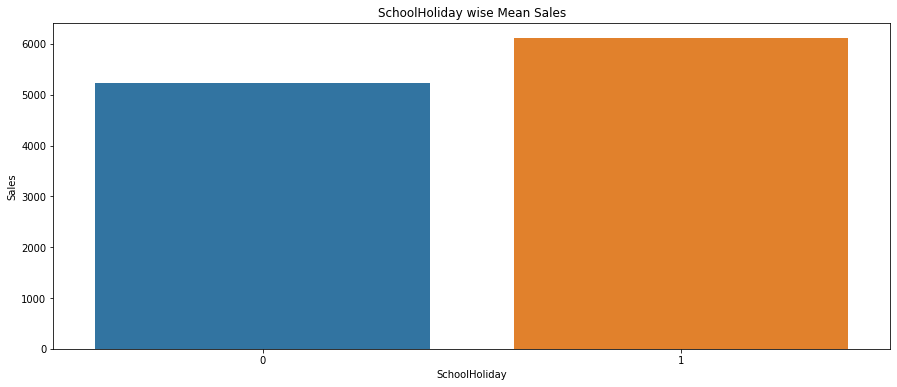

In [34]:
mean_sales_monthwise = master_ds_copy.groupby(['SchoolHoliday'])['Sales'].mean()

fig,ax = plt.subplots(figsize=(15,6))
fig = sns.barplot(y=mean_sales_monthwise,x=mean_sales_monthwise.index)
ax.set(ylabel='Sales', xlabel='SchoolHoliday', title='SchoolHoliday wise Mean Sales')
plt.show()

### Pre-Processing : Part 2

#### Outlier Detection and Removing

In [35]:
master_ds[['Sales','Customers']].describe()

,Sales,Customers
count,8110.000000,8110.000000
mean,5394.031566,590.330210
std,3455.976814,421.269874
min,0.000000,0.000000
25%,3792.250000,421.000000
50%,5406.000000,573.000000
75%,7252.500000,720.000000
max,24882.000000,2835.000000


- We will detect rows where Sales and Customers is above 99 percentile, as those are most probably the outliers

In [36]:
Q_99 = np.percentile(master_ds['Sales'],99)

sales_outliers = master_ds[master_ds['Sales']>Q_99].index
print('No. of outliers detected in Sales Column : ',len(sales_outliers))

No. of outliers detected in Sales Column :  82


In [37]:
Q_99 = np.percentile(master_ds['Customers'],99)

customers_outliers = master_ds[master_ds['Customers']>Q_99].index
print('No. of outliers detected in Customers Column : ',len(customers_outliers))

No. of outliers detected in Customers Column :  82


- We will remove only common rows from Sales Outliers and Customers Outliers

In [38]:
common_outliers = set(sales_outliers).intersection(set(customers_outliers))
print('No. of Common Outliers : ',len(common_outliers))
print("Percentage of Outliers : ",round(len(common_outliers)/len(master_ds)*100,2),'%')

No. of Common Outliers :  65
Percentage of Outliers :  0.8 %


In [39]:
## removing common outliers from master_ds

print('Initial length : ',len(master_ds))

master_ds = master_ds[~master_ds.index.isin(common_outliers)].reset_index()


print('Final length : ',len(master_ds))

Initial length :  8110
Final length :  8045


- Removing rows where Store was Close, as this is not going to help us in any ways

In [40]:
#master_ds = master_ds[master_ds['Open']!=0]
#len(master_ds)

- Mapping columns having Categorical values

In [41]:
master_ds['StoreType'].value_counts()

a    2826
d    2642
c    2577
Name: StoreType, dtype: int64

In [42]:
master_ds['StoreType'].replace({'a':1, 'b':2, 'c':3, 'd':4},inplace=True)

In [43]:
master_ds['Assortment'].value_counts()

a    5219
c    2826
Name: Assortment, dtype: int64

In [44]:
master_ds['Assortment'].replace({'a':1, 'b':2, 'c':3},inplace=True)

In [45]:
master_ds['StateHoliday'].value_counts()

0    6782
0    1014
a     163
b      54
c      32
Name: StateHoliday, dtype: int64

In [46]:
master_ds['StateHoliday'].replace({'0':0,'a':1, 'b':2, 'c':3},inplace=True)

In [47]:
#master_ds['Year'] = master_ds['Date'].apply(lambda x: x.year)
master_ds['Month'] = master_ds['Date'].apply(lambda x: x.month)
master_ds['Day'] = master_ds['Date'].apply(lambda x: x.day)
master_ds['DayOfWeek'] = master_ds['Date'].apply(lambda x: x.dayofweek)
master_ds['WeekOfYear'] = master_ds['Date'].apply(lambda x: x.weekofyear)

In [48]:
# master_ds['PromoOpen'] = 12 * (master_ds['Year'] - )

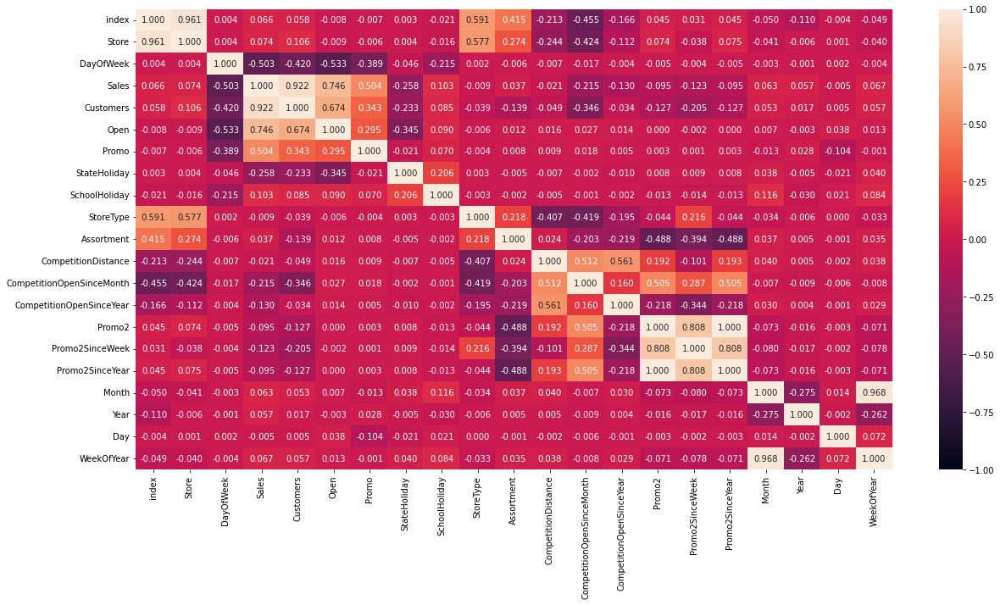

In [49]:
plt.figure(figsize=(20,10))

sns.heatmap(master_ds.corr(),annot=True, fmt='.3f', vmin=-1, vmax=1)

In [50]:
# cor = master_ds.corr()
# #Correlation with output variable
# cor_target = abs(cor["Sales"])
# #Selecting highly correlated features
# relevant_features = cor_target[cor_target>0.2]
# relevant_features

In [51]:
# ## we will consider only those columns which are showing more than +0.1 or -0.1 correlation with Sales columns

# final_columns = list(relevant_features.index)
# master_ds = master_ds[final_columns]

In [52]:
master_ds = master_ds.drop(columns=['index','MonthYear','Year'])
master_ds.columns

Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
       'CompetitionDistance', 'CompetitionOpenSinceMonth',
       'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
       'Promo2SinceYear', 'PromoInterval', 'Month', 'Day', 'WeekOfYear'],
      dtype='object')

In [53]:
master_ds.set_index('Date',inplace = True)
master_ds.sort_index(ascending=True,inplace = True)

### Creating Dummy Variables for DayOfWeek Column

In [54]:
master_ds_dummy = pd.get_dummies(master_ds, prefix='DayOfWeek', columns=['DayOfWeek'])
master_ds_dummy.columns

Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'StoreType', 'Assortment', 'CompetitionDistance',
       'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2',
       'Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval', 'Month', 'Day',
       'WeekOfYear', 'DayOfWeek_0', 'DayOfWeek_1', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6'],
      dtype='object')

- I have created Dummy Variables for DayOfWeek Column, but I will not be using these dummy variables for modeling, instead I will be using DayOfWeek column itself because I think that the Single column DayOfWeek will perform better

## Time Series Analysis & Modeling

In [55]:
ts_master_ds = master_ds.copy() 

In [56]:
ts_master_ds.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,46,1,0,0,0,0,1,1,3,1,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,1,1
2013-01-01,1,1,0,0,0,0,1,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,1,1,1
2013-01-01,31,1,0,0,0,0,1,1,4,3,9800.0,7.0,2012.0,0,0.0,0.0,0,1,1,1
2013-01-01,13,1,0,0,0,0,1,1,4,1,310.0,9.0,2000.0,1,45.0,2009.0,"Feb,May,Aug,Nov",1,1,1
2013-01-01,8,1,0,0,0,0,1,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,1,1,1


### Defining Functions

In [57]:
def adfuller_test(series, signif=0.05, name='', verbose=False):
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")    
    

"""
    Johansen cointegration test of the cointegration rank of a VECM

    Parameters
    ----------
    endog : array_like (nobs_tot x neqs)
        Data to test
    det_order : int
        * -1 - no deterministic terms - model1
        * 0 - constant term - model3
        * 1 - linear trend
    k_ar_diff : int, nonnegative
        Number of lagged differences in the model.
"""

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [58]:
# creating 2 lists which will contain results and all models of each stores

results_summary = []
models_summary = []

# Store 1

In [59]:
store = ts_master_ds[ts_master_ds['Store']==1]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,1,1,0,0,0,0,1,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,1,1,1
2013-01-02,1,2,5530,668,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,1,2,1
2013-01-03,1,3,4327,578,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,1,3,1
2013-01-04,1,4,4486,619,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,1,4,1
2013-01-05,1,5,4997,635,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,1,5,1


In [60]:
store.shape

(942, 20)

In [61]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [62]:
store.shape

(942, 10)

In [63]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]


  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

No Data missing


## Plot Sales data

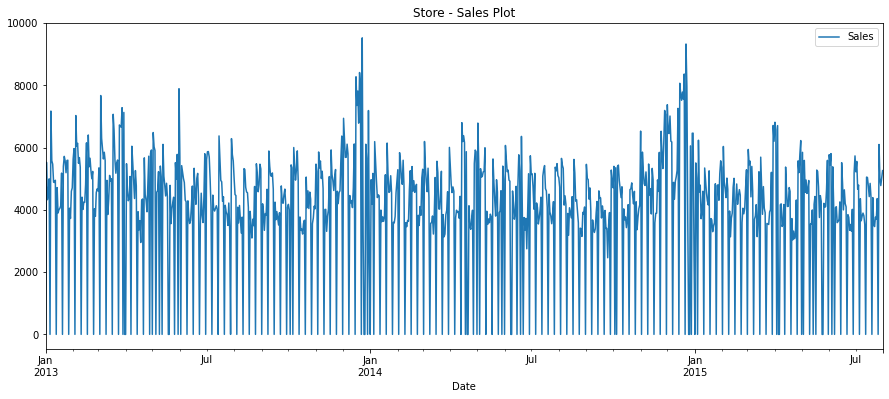

In [64]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

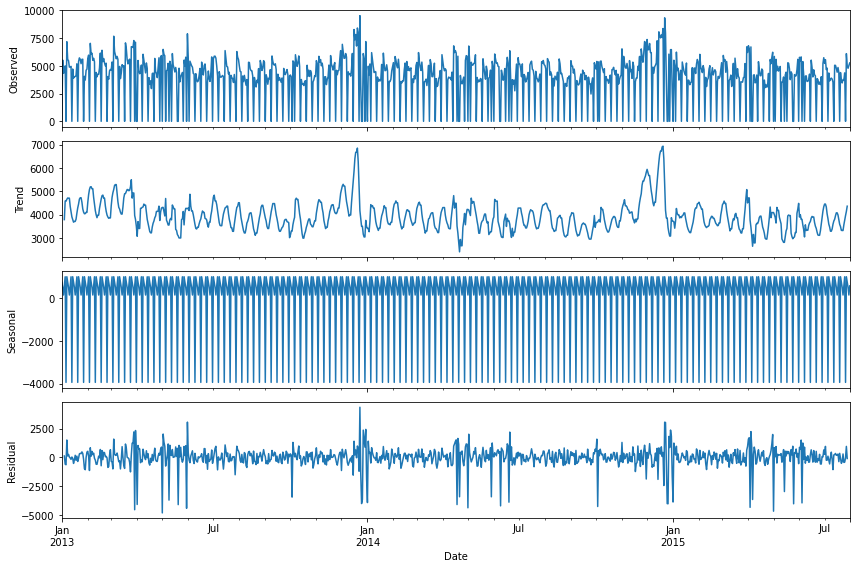

In [65]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [66]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.0
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.9585. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.3681
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0003. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stati

In [67]:
# 1st difference
store_diff = store.diff().dropna()

In [68]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.0169971764429466e+16
 No. Lags Chosen       = 11
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -11.4942
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.


All Columns are now stationary

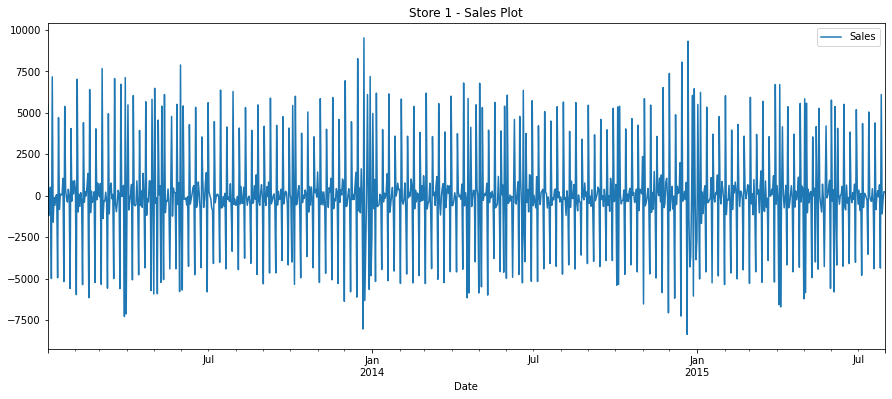

In [69]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

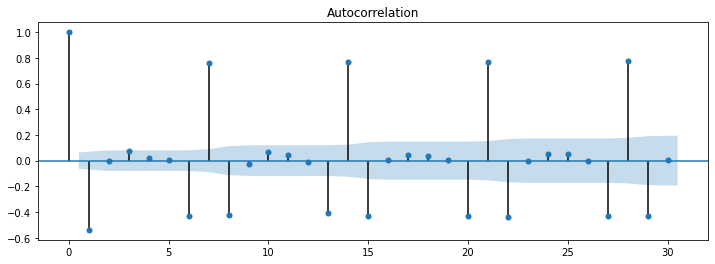

In [70]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

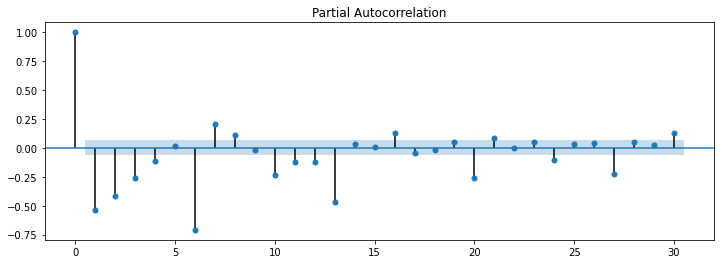

In [71]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 5 as per above PACF plot

In [72]:
AR = 5
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [73]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [74]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(5)   Log Likelihood              -12671.079
Date:                    Fri, 08 Apr 2022   AIC                          25388.158
Time:                            06:48:02   BIC                          25498.587
Sample:                        01-02-2013   HQIC                         25430.345
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             2157.50, 275.33   Jarque-Bera (JB):         231.67, 3.88
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.14
Heteroskedasticity (H):         1.10, 0.88   Skew:                     -1.20, -0.01
Prob(H) (two-sided):            0.39, 0.28   Kurtosis:                   3.63, 3.32


### Recover original time series

In [75]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

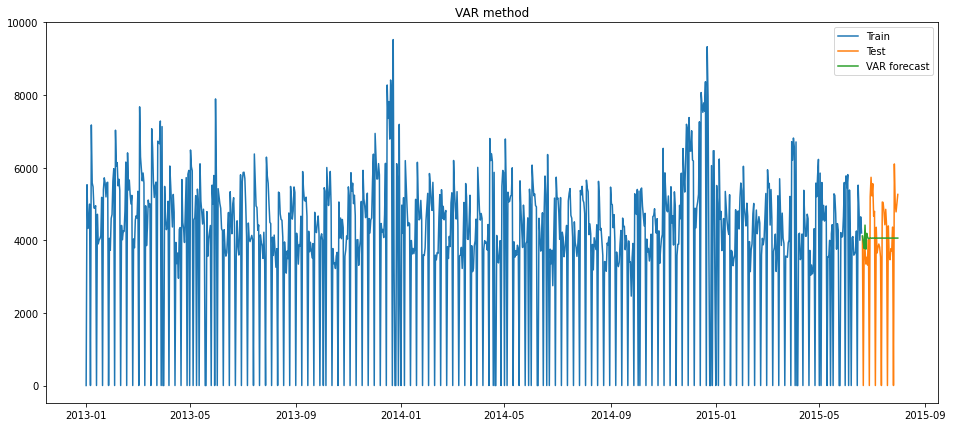

In [76]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [77]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1697.52,14.25


## Cointegration - Johansen Test

In [78]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1286.951895  6664.989440
1   1059.360605  5378.037545
2    856.153726  4318.676940
3    816.645565  3462.523214
4    670.268423  2645.877649
5    649.732245  1975.609226
6    428.488047  1325.876981
7    400.859451   897.388934
8    262.114401   496.529483
9    234.415082   234.415082 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [79]:
train_data_diff.shape

(899, 10)

In [80]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
Date,,,,,,,,,,
2013-01-02,1.0,5530.0,668.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-1203.0,-90.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,159.0,41.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,511.0,16.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-06,1.0,-4997.0,-635.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [81]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [82]:
# In VARMAX model, I am using AR = 2, because it gives better result

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -12563.089
Date:                    Fri, 08 Apr 2022   AIC                          25180.178
Time:                            06:48:52   BIC                          25309.813
Sample:                        01-02-2013   HQIC                         25229.702
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             2491.18, 892.15   Jarque-Bera (JB):          85.64, 9.42
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.01
Heteroskedasticity (H):         1.26, 1.17   Skew:                       0.45, 0.25
Prob(H) (two-sided):            0.04, 0.18   Kurtosis:                   4.22, 2.92


### Recover original time series

In [83]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

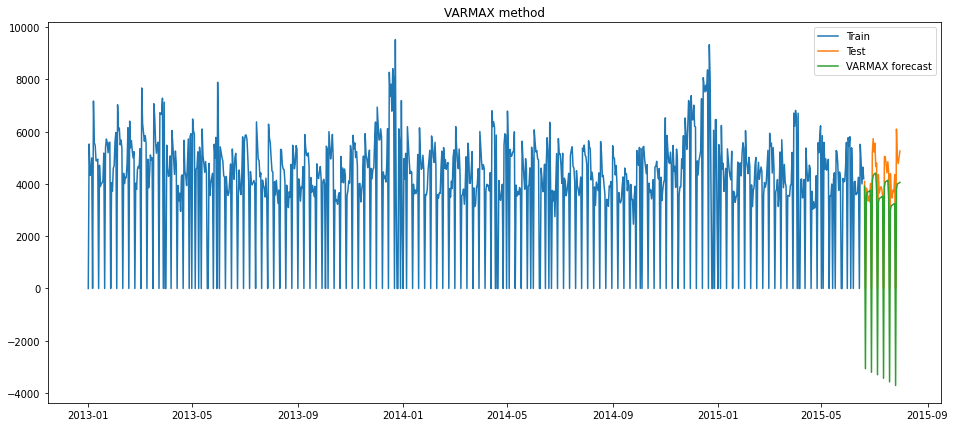

In [84]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [85]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1697.52,14.25
0,VARMAX method,1505.54,14.94


## ARIMA Model

In [86]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(5, 1, 2)   Log Likelihood               -8066.390
Method:                       css-mle   S.D. of innovations           1899.890
Date:                Fri, 08 Apr 2022   AIC                          16150.780
Time:                        06:48:55   BIC                          16193.992
Sample:                    01-02-2013   HQIC                         16167.288
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.3715      0.258     -1.438      0.151      -0.878       0.135
ar.L1.D.Sales    -0.8910      0.038    -23.263      0.000      -0.966      -0.816
ar.L2.D.Sales    -0.1595      0.044     

### Recover original time series

In [87]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

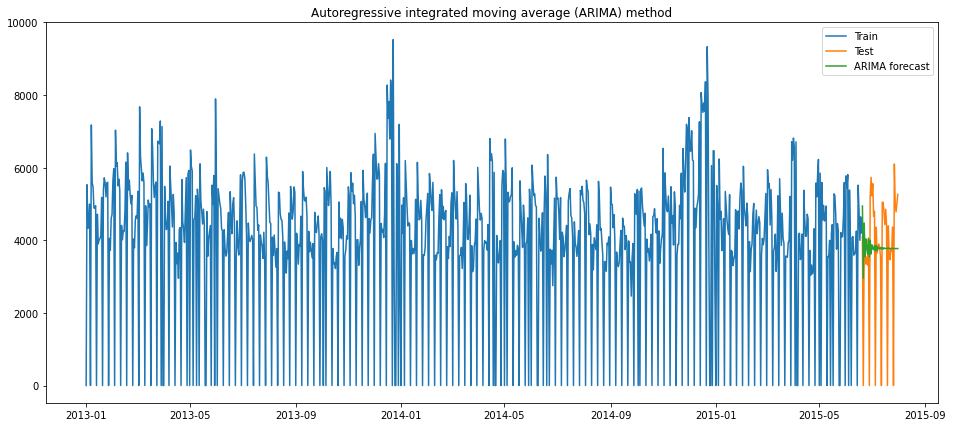

In [88]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [89]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1697.52,14.25
0,VARMAX method,1505.54,14.94
0,ARIMA method,1625.57,15.75


## SARIMA Model

In [90]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(5, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7653.039
Date:                           Fri, 08 Apr 2022   AIC                          15326.079
Time:                                   06:49:15   BIC                          15374.013
Sample:                               01-01-2013   HQIC                         15344.398
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2450      0.220      5.656      0.000       0.814       1.676
ar.L2         -0.0913      0.097     -0.943

### Recover original time series

In [91]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

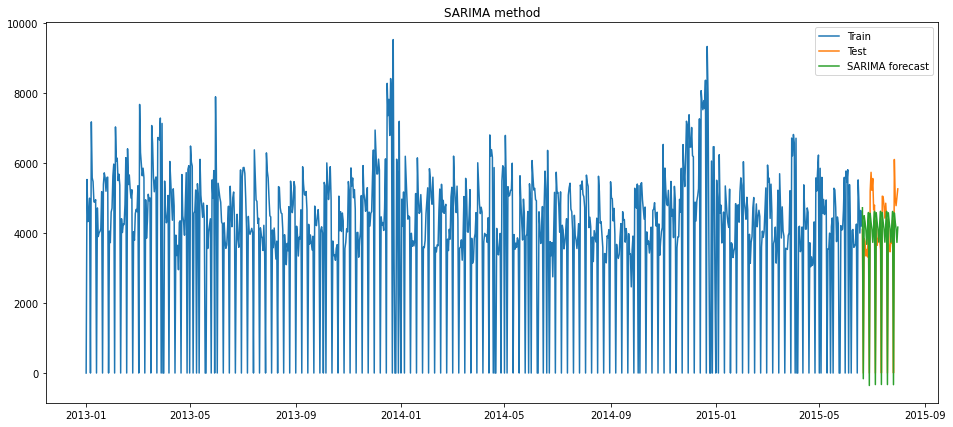

In [92]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [93]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1697.52,14.25
0,VARMAX method,1505.54,14.94
0,ARIMA method,1625.57,15.75
0,SARIMA method,725.98,14.71


## SARIMAX Model

In [94]:
train_data.shape

(900, 10)

In [95]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [96]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(5, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7016.602
Date:                           Fri, 08 Apr 2022   AIC                          14069.204
Time:                                   06:49:49   BIC                          14155.487
Sample:                               01-01-2013   HQIC                         14102.179
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       39.0510      3.090     12.637      0.000      32.994      45.108
Promo          1195.4754     62.89

### Recover original time series

In [97]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

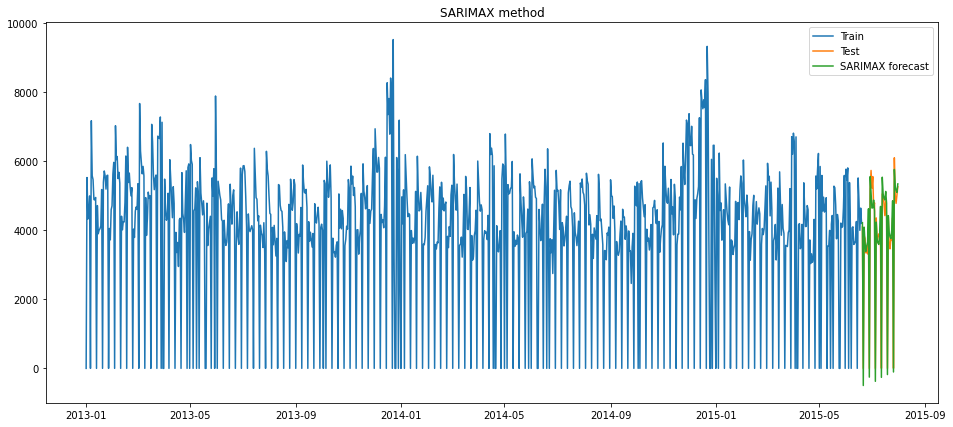

In [98]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [99]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1697.52,14.25
0,VARMAX method,1505.54,14.94
0,ARIMA method,1625.57,15.75
0,SARIMA method,725.98,14.71
0,SARIMAX method,379.70,6.85


## Best Model is SARIMAX

## Impulse Response Function

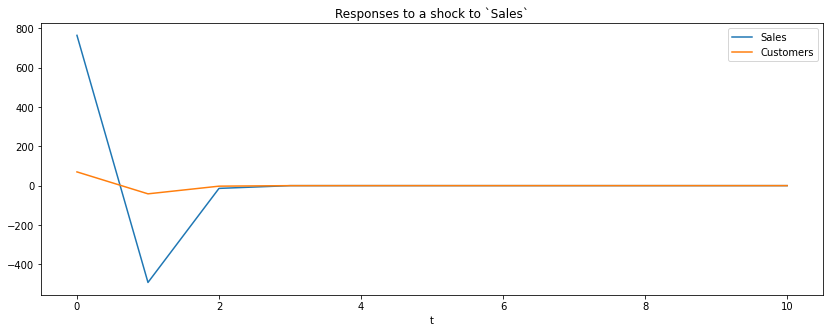

In [100]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [101]:
results_summary.append(results)
models_summary.append(models)

# Store 3

In [102]:
store = ts_master_ds[ts_master_ds['Store']==3]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,3,1,0,0,0,0,1,1,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,1,1
2013-01-02,3,2,6823,805,1,0,0,1,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,2,1
2013-01-03,3,3,5902,721,1,0,0,1,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,3,1
2013-01-04,3,4,6069,690,1,0,0,1,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,4,1
2013-01-05,3,5,4523,525,1,0,0,0,1,1,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,5,1


In [103]:
store.shape

(942, 20)

In [104]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [105]:
store.shape

(942, 10)

In [106]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

No Data missing


## Plot Sales data

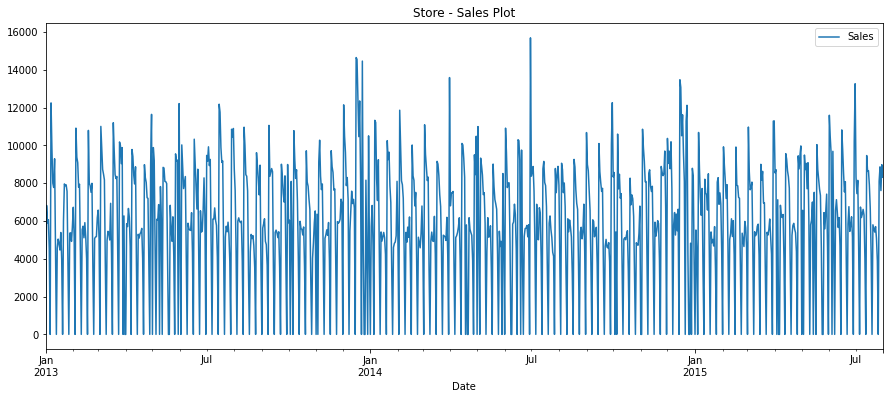

In [107]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

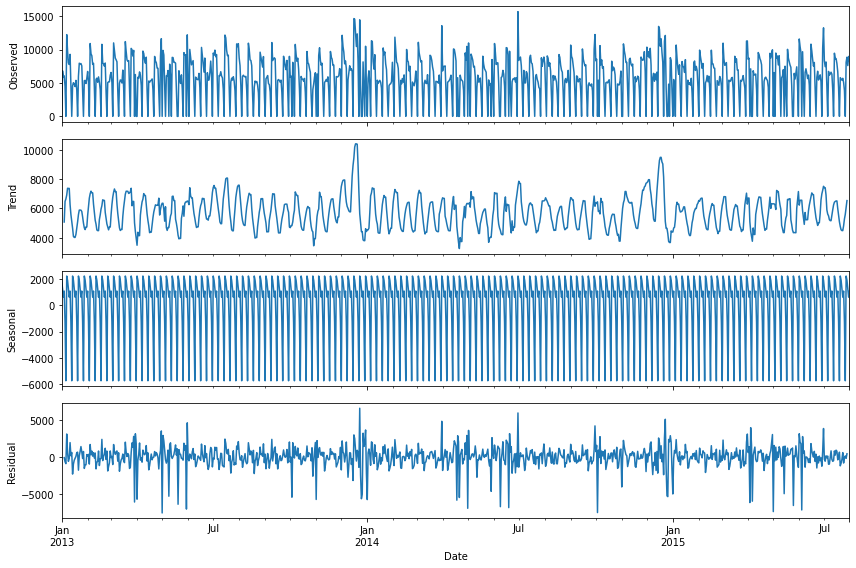

In [108]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [109]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.0
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.9585. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.9115
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationa

In [110]:
# 1st difference
store_diff = store.diff().dropna()

In [111]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.0169971764429466e+16
 No. Lags Chosen       = 11
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -14.7197
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.


All Columns are now stationary

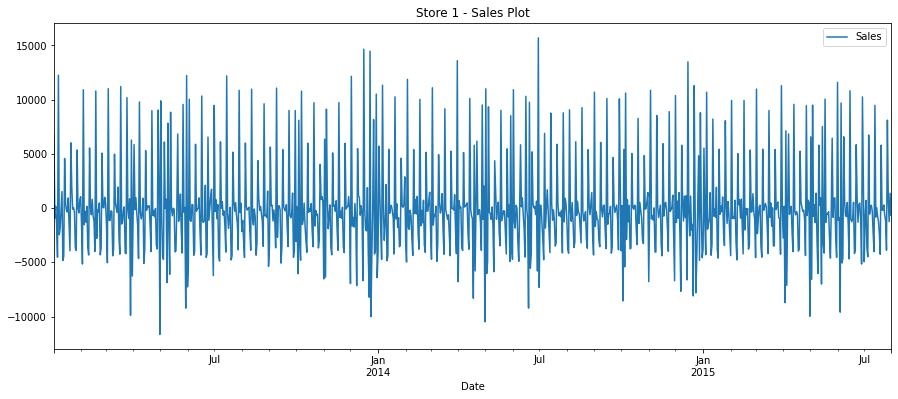

In [112]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

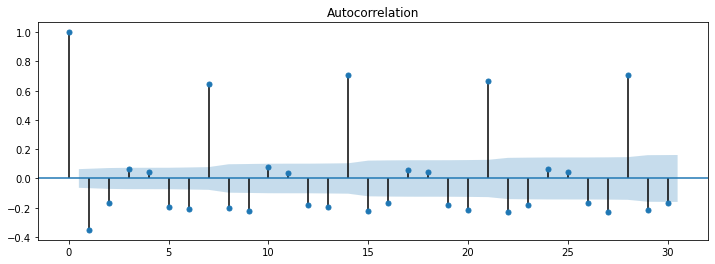

In [113]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 3 as per above PACF plot

## Partial autocorrelation function (PACF)

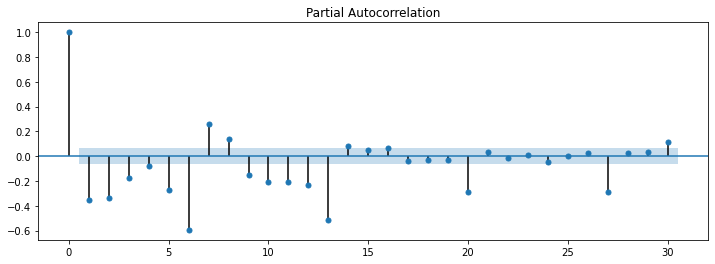

In [114]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 4 as per above PACF plot

In [115]:
AR = 4
MA = 3
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [116]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [117]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(4)   Log Likelihood              -13682.445
Date:                    Fri, 08 Apr 2022   AIC                          27402.889
Time:                            06:49:57   BIC                          27494.113
Sample:                        01-02-2013   HQIC                         27437.739
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             2288.85, 414.18   Jarque-Bera (JB):        28.47, 133.24
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.03, 1.11   Skew:                      -0.41, 0.03
Prob(H) (two-sided):            0.81, 0.39   Kurtosis:                   2.69, 4.88


### Recover original time series

In [118]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

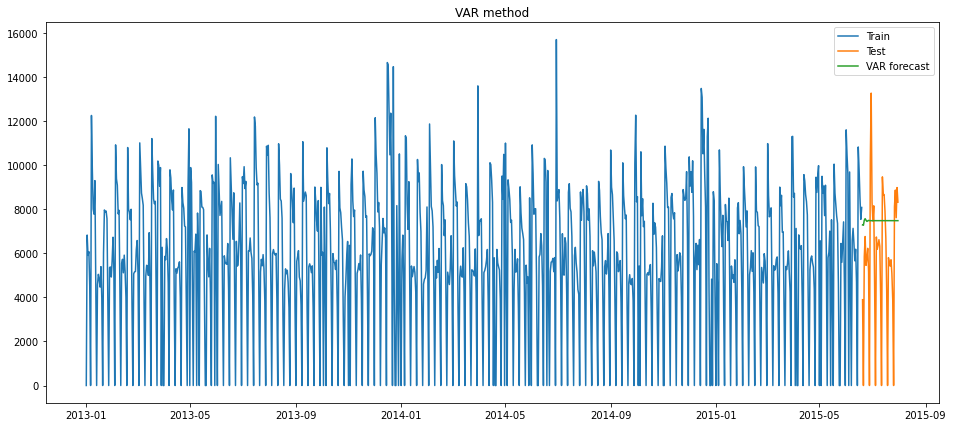

In [119]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [120]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3400.56,29.1


## Cointegration - Johansen Test

In [121]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1245.506782  6859.612710
1   1018.917791  5614.105928
2    970.941255  4595.188137
3    826.143725  3624.246882
4    677.991946  2798.103157
5    646.692615  2120.111211
6    585.883779  1473.418596
7    410.202827   887.534817
8    275.647012   477.331991
9    201.684979   201.684979 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [122]:
train_data_diff.shape

(899, 10)

In [123]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
Date,,,,,,,,,,
2013-01-02,1.0,6823.0,805.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-921.0,-84.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,167.0,-31.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,-1546.0,-165.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-4523.0,-525.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [124]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [125]:
# In VARMAX model, I am using AR = 2, because it gives better result

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -13428.263
Date:                    Fri, 08 Apr 2022   AIC                          26910.527
Time:                            06:50:29   BIC                          27040.161
Sample:                        01-02-2013   HQIC                         26960.051
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1410.70, 370.80   Jarque-Bera (JB):         2.76, 176.08
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.25, 0.00
Heteroskedasticity (H):         1.20, 1.16   Skew:                      0.04, -0.48
Prob(H) (two-sided):            0.12, 0.19   Kurtosis:                   3.26, 4.95


### Recover original time series

In [126]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

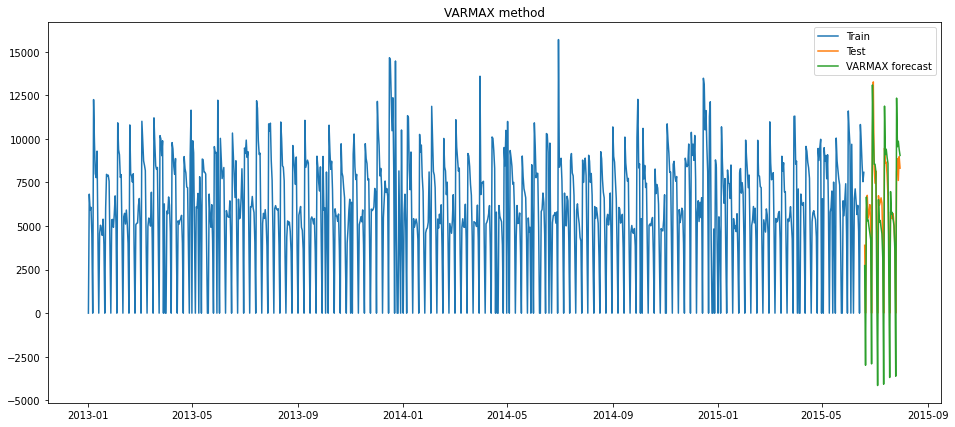

In [127]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [128]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3400.56,29.10
0,VARMAX method,1972.23,17.99


## ARIMA Model

In [129]:
model = ARIMA(train_data["Sales"], order=(AR, D, 4))
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(4, 1, 4)   Log Likelihood               -8413.172
Method:                       css-mle   S.D. of innovations           2783.293
Date:                Fri, 08 Apr 2022   AIC                          16846.344
Time:                        06:50:36   BIC                          16894.357
Sample:                    01-02-2013   HQIC                         16864.687
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0804      0.544     -0.148      0.883      -1.146       0.985
ar.L1.D.Sales    -0.5891      0.100     -5.899      0.000      -0.785      -0.393
ar.L2.D.Sales    -0.8213      0.033    -

### Recover original time series

In [130]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

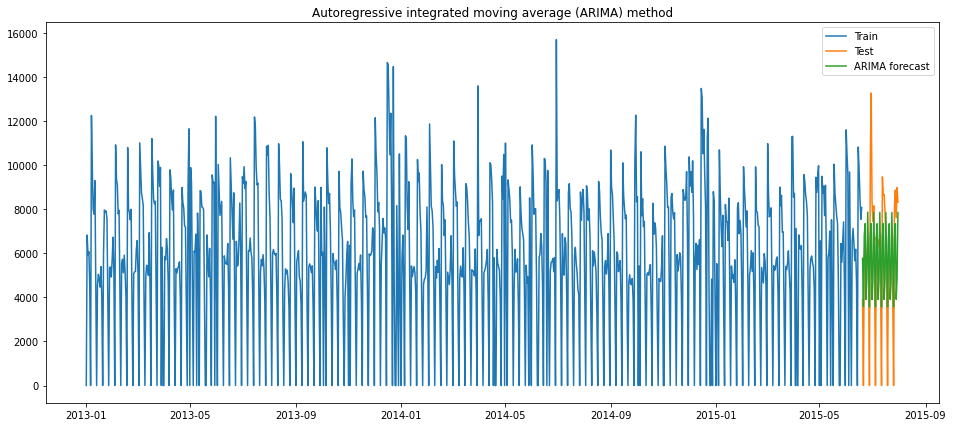

In [131]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [132]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3400.56,29.10
0,VARMAX method,1972.23,17.99
0,ARIMA method,2558.58,27.92


## SARIMA Model

In [133]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 3)x(1, 1, 1, 7)   Log Likelihood               -8103.295
Date:                           Fri, 08 Apr 2022   AIC                          16226.589
Time:                                   06:50:50   BIC                          16274.524
Sample:                               01-01-2013   HQIC                         16244.909
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1855      0.801     -1.481      0.139      -2.755       0.384
ar.L2         -0.2065      0.393     -0.525

### Recover original time series

In [134]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

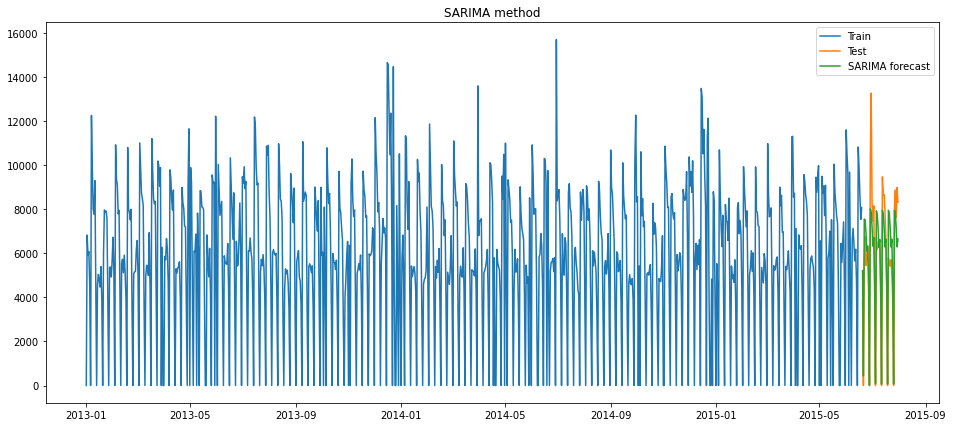

In [135]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [136]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3400.56,29.10
0,VARMAX method,1972.23,17.99
0,ARIMA method,2558.58,27.92
0,SARIMA method,1441.47,17.34


## SARIMAX Model

In [137]:
train_data.shape

(900, 10)

In [138]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))
exog = train_data[exog_columns]

exog.shape

(900, 8)

In [139]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 3)x(1, 1, 1, 7)   Log Likelihood               -7567.640
Date:                           Fri, 08 Apr 2022   AIC                          15171.279
Time:                                   06:51:13   BIC                          15257.562
Sample:                               01-01-2013   HQIC                         15204.254
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       12.7543      8.848      1.442      0.149      -4.587      30.096
Promo          3221.0796    166.33

### Recover original time series

In [140]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

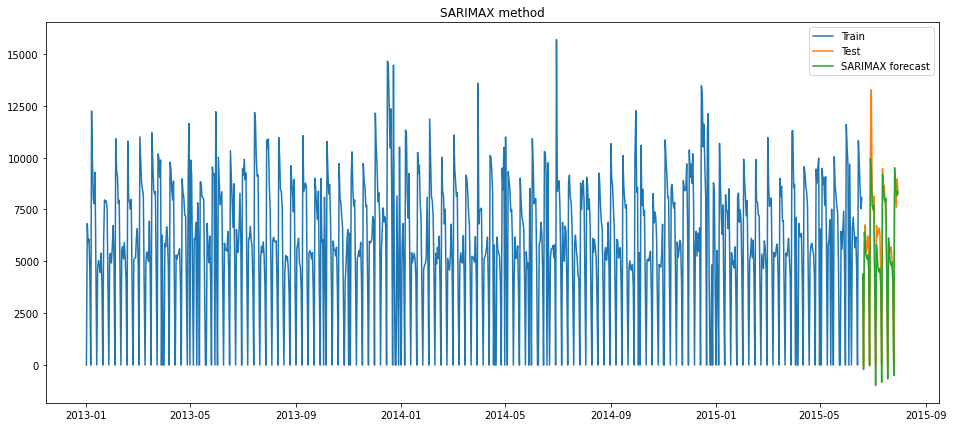

In [141]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [142]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3400.56,29.10
0,VARMAX method,1972.23,17.99
0,ARIMA method,2558.58,27.92
0,SARIMA method,1441.47,17.34
0,SARIMAX method,1003.07,10.80


## Best Model is SARIMAX

## Impulse Response Function

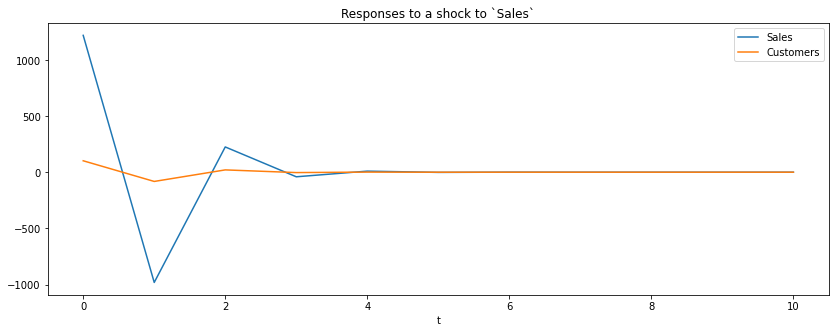

In [143]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [144]:
results_summary.append(results)
models_summary.append(models)

# Store 8

In [145]:
store = ts_master_ds[ts_master_ds['Store']==8]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,8,1,0,0,0,0,1,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,1,1,1
2013-01-02,8,2,5419,698,1,0,0,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,1,2,1
2013-01-03,8,3,4842,662,1,0,0,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,1,3,1
2013-01-04,8,4,4059,517,1,0,0,1,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,1,4,1
2013-01-05,8,5,2337,312,1,0,0,0,1,1,7520.0,10.0,2014.0,0,0.0,0.0,0,1,5,1


In [146]:
store.shape

(942, 20)

In [147]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [148]:
store.shape

(942, 10)

In [149]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")


else :
  print("No Data missing")

No Data missing


## Plot Sales data

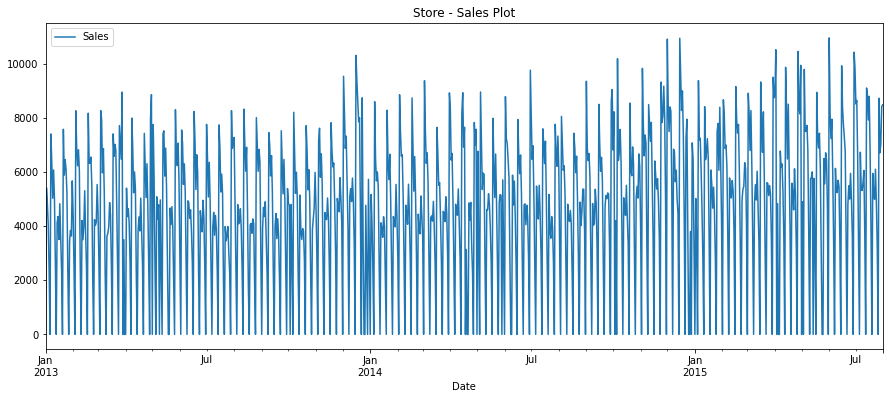

In [150]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

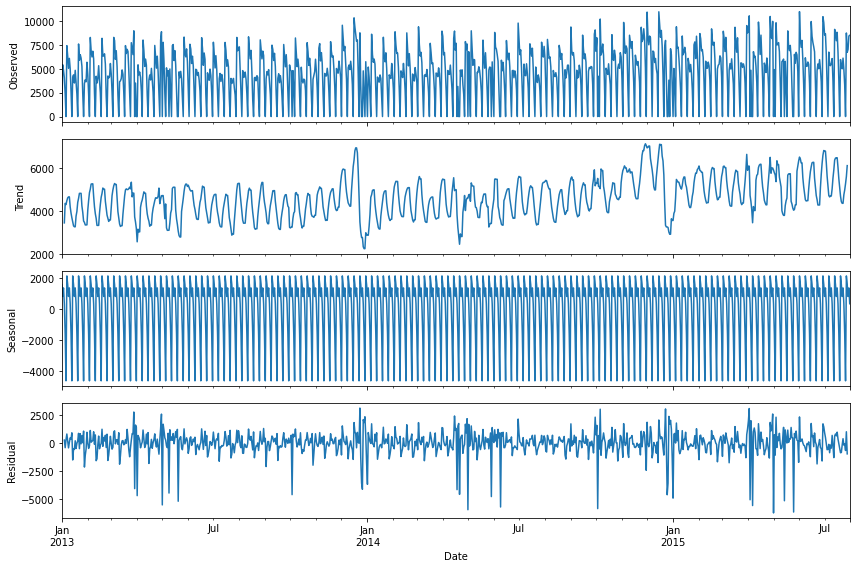

In [151]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [152]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.0
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.9585. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.566
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0064. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Statio

In [153]:
# 1st difference
store_diff = store.diff().dropna()

In [154]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.0169971764429466e+16
 No. Lags Chosen       = 11
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.7435
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.


All Columns are now stationary

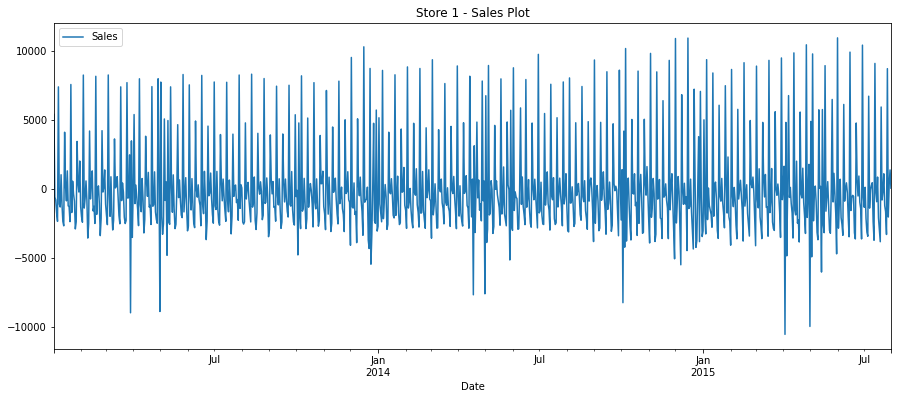

In [155]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

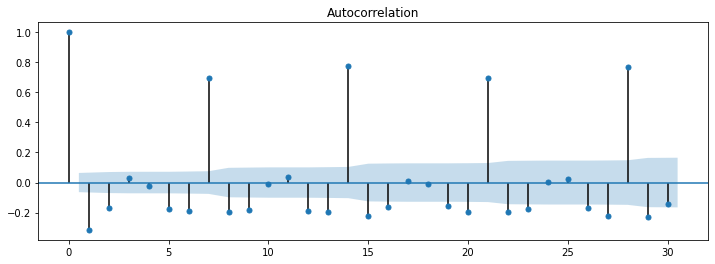

In [156]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 3 as per above PACF plot

## Partial autocorrelation function (PACF)

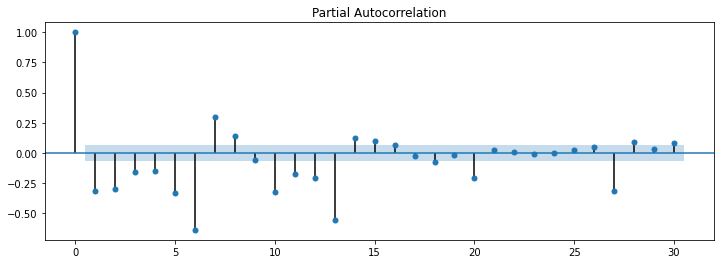

In [157]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 9 as per above PACF plot

In [158]:
AR = 9
MA = 3
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [159]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [160]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(9)   Log Likelihood              -12611.454
Date:                    Fri, 08 Apr 2022   AIC                          25300.907
Time:                            06:52:04   BIC                          25488.157
Sample:                        01-02-2013   HQIC                         25372.442
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               164.32, 91.72   Jarque-Bera (JB):      1497.99, 129.98
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.52, 1.48   Skew:                     -0.41, -0.03
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   9.27, 4.86


### Recover original time series

In [161]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

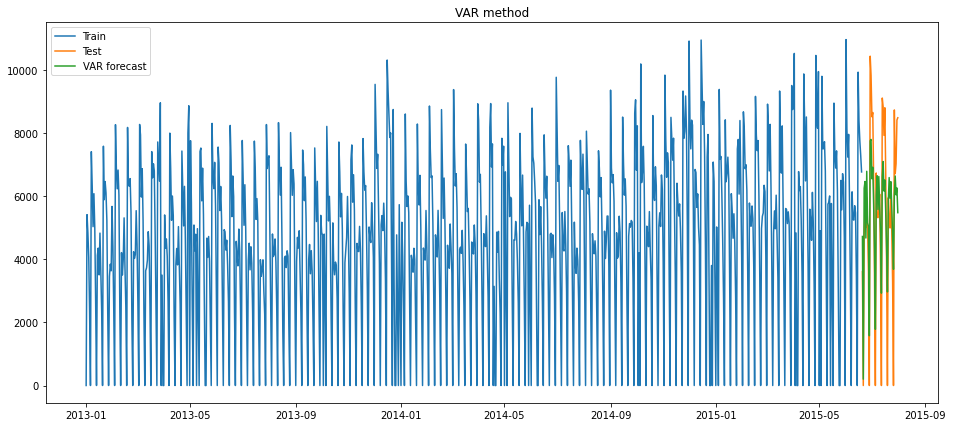

In [162]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [163]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1658.07,19.83


## Cointegration - Johansen Test

In [164]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1918.633738  7533.847223
1   1086.979297  5615.213485
2   1014.567760  4528.234187
3    791.030170  3513.666428
4    665.662326  2722.636257
5    627.726154  2056.973931
6    549.156955  1429.247778
7    414.840535   880.090822
8    273.455351   465.250288
9    191.794936   191.794936 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [165]:
train_data_diff.shape

(899, 10)

In [166]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
Date,,,,,,,,,,
2013-01-02,1.0,5419.0,698.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-577.0,-36.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,-783.0,-145.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,-1722.0,-205.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-2337.0,-312.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [167]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [168]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -12852.396
Date:                    Fri, 08 Apr 2022   AIC                          25758.793
Time:                            06:52:25   BIC                          25888.428
Sample:                        01-02-2013   HQIC                         25808.317
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1466.30, 749.17   Jarque-Bera (JB):          4.22, 35.68
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.12, 0.00
Heteroskedasticity (H):         0.82, 1.17   Skew:                       0.16, 0.35
Prob(H) (two-sided):            0.09, 0.17   Kurtosis:                   3.10, 3.68


### Recover original time series

In [169]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

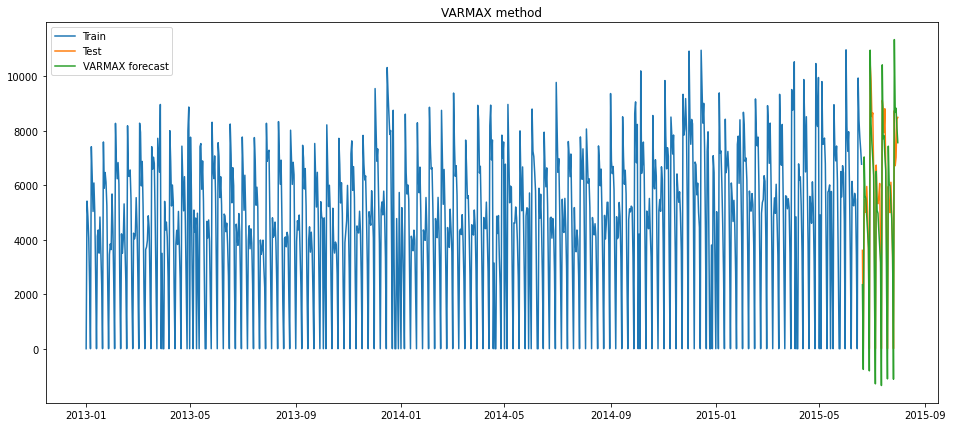

In [170]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [171]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1658.07,19.83
0,VARMAX method,1194.24,16.37


## ARIMA Model

In [172]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(9, 1, 3)   Log Likelihood               -7955.634
Method:                       css-mle   S.D. of innovations           1674.173
Date:                Fri, 08 Apr 2022   AIC                          15939.268
Time:                        06:54:00   BIC                          16006.486
Sample:                    01-02-2013   HQIC                         15964.947
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.4559      0.464      3.137      0.002       0.546       2.366
ar.L1.D.Sales     1.2371      0.034     35.865      0.000       1.169       1.305
ar.L2.D.Sales    -0.7805      0.046    -

### Recover original time series

In [173]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

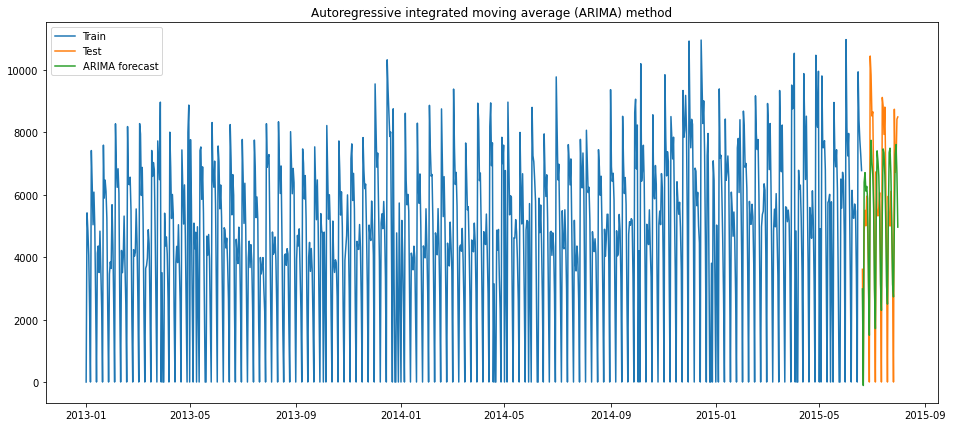

In [174]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [175]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1658.07,19.83
0,VARMAX method,1194.24,16.37
0,ARIMA method,1790.63,21.23


## SARIMA Model

In [176]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(9, 1, 3)x(1, 1, 1, 7)   Log Likelihood               -7738.329
Date:                           Fri, 08 Apr 2022   AIC                          15506.659
Time:                                   06:54:28   BIC                          15578.560
Sample:                               01-01-2013   HQIC                         15534.137
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7661      1.196     -0.640      0.522      -3.111       1.579
ar.L2         -0.2252      0.612     -0.368

### Recover original time series

In [177]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

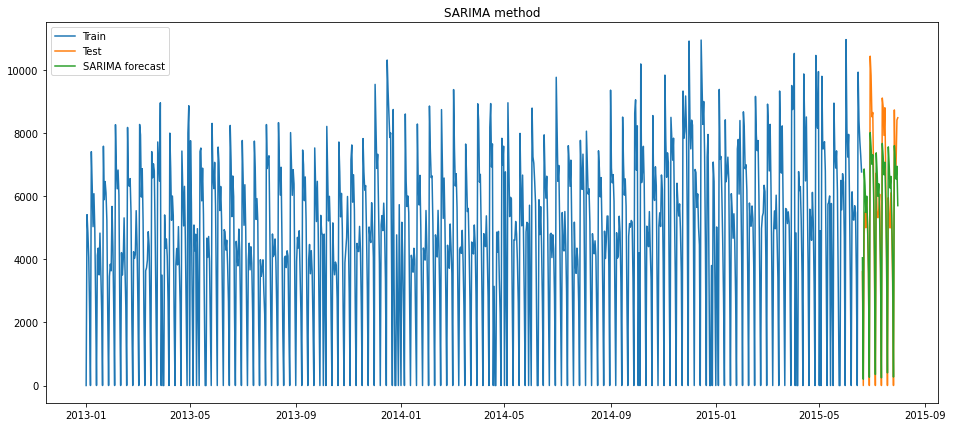

In [178]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [179]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1658.07,19.83
0,VARMAX method,1194.24,16.37
0,ARIMA method,1790.63,21.23
0,SARIMA method,1154.05,15.40


## SARIMAX Model

In [180]:
train_data.shape

(900, 10)

In [181]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [182]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(9, 1, 3)x(1, 1, 1, 7)   Log Likelihood               -7100.432
Date:                           Fri, 08 Apr 2022   AIC                          14246.863
Time:                                   06:55:05   BIC                          14357.113
Sample:                               01-01-2013   HQIC                         14288.997
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       18.1791      7.076      2.569      0.010       4.311      32.047
Promo          2306.6034    111.84

### Recover original time series

In [183]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

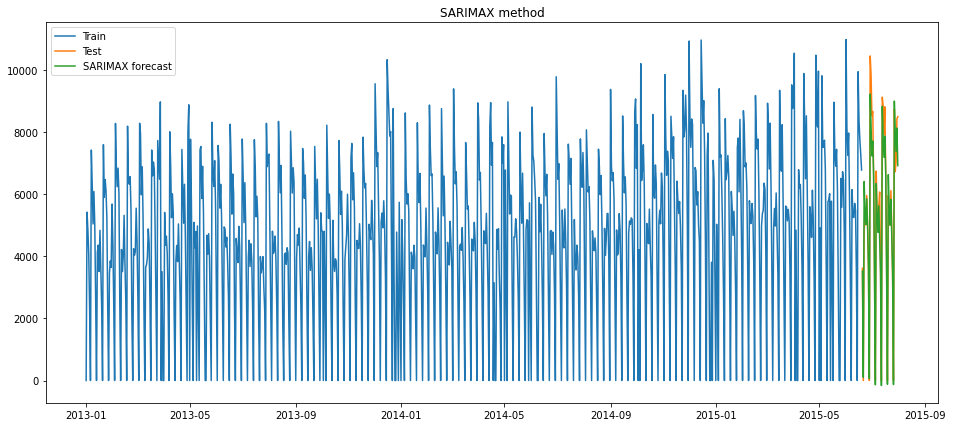

In [184]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [185]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,1658.07,19.83
0,VARMAX method,1194.24,16.37
0,ARIMA method,1790.63,21.23
0,SARIMA method,1154.05,15.40
0,SARIMAX method,696.89,7.76


## Best Model is SARIMAX

## Impulse Response Function

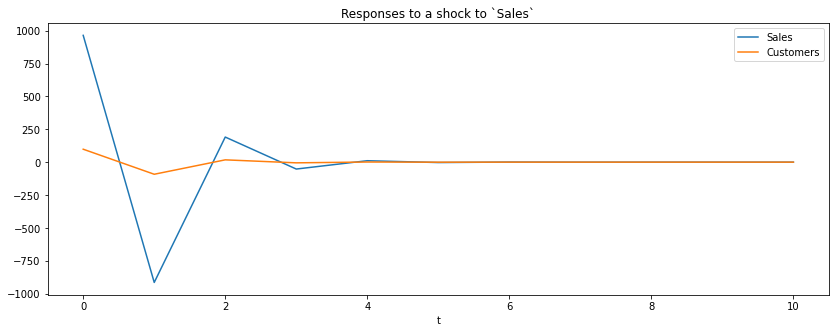

In [186]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [187]:
results_summary.append(results)
models_summary.append(models)

# Store 9

In [188]:
store = ts_master_ds[ts_master_ds['Store']==9]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,9,1,0,0,0,0,1,1,1,3,2030.0,8.0,2000.0,0,0.0,0.0,0,1,1,1
2013-01-02,9,2,4903,481,1,0,0,1,1,3,2030.0,8.0,2000.0,0,0.0,0.0,0,1,2,1
2013-01-03,9,3,4602,453,1,0,0,1,1,3,2030.0,8.0,2000.0,0,0.0,0.0,0,1,3,1
2013-01-04,9,4,4798,497,1,0,0,1,1,3,2030.0,8.0,2000.0,0,0.0,0.0,0,1,4,1
2013-01-05,9,5,4254,450,1,0,0,0,1,3,2030.0,8.0,2000.0,0,0.0,0.0,0,1,5,1


In [189]:
store.shape

(942, 20)

In [190]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [191]:
store.shape

(942, 10)

In [192]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

No Data missing


## Plot Sales data

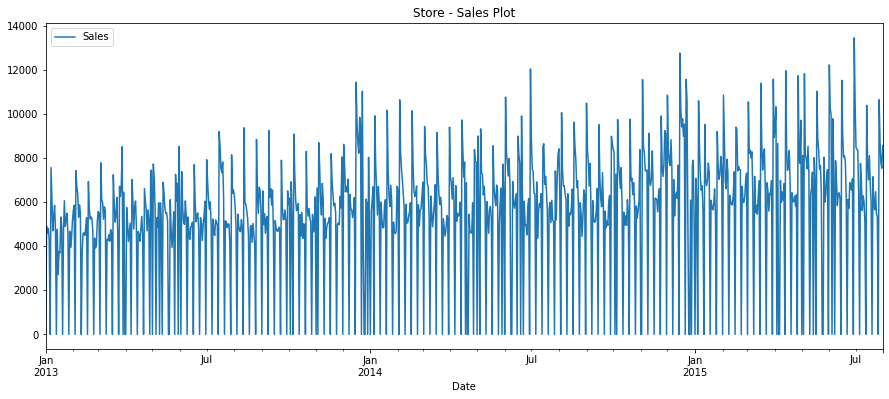

In [193]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

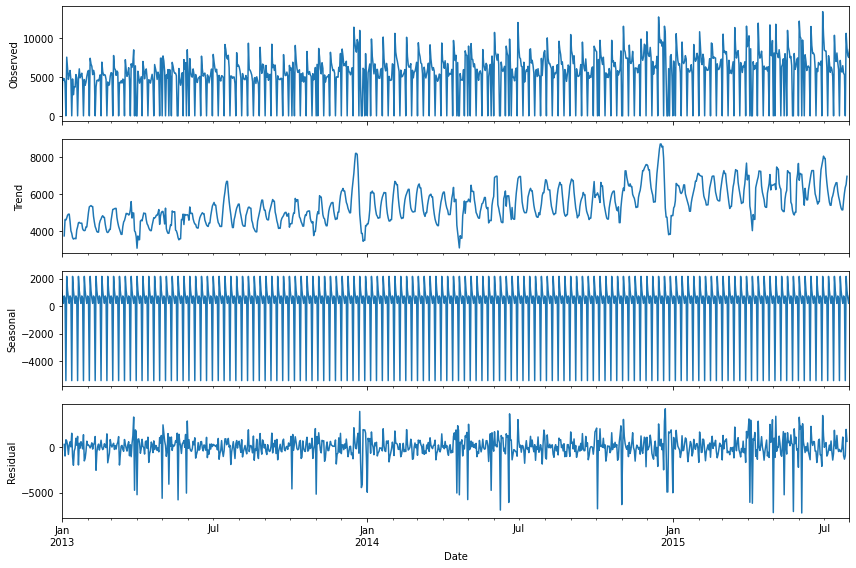

In [194]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [195]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.0
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.9585. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.1663
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.022. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Statio

In [196]:
# 1st difference
store_diff = store.diff().dropna()

In [197]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.0169971764429466e+16
 No. Lags Chosen       = 11
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -14.3488
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.


All Columns are now stationary

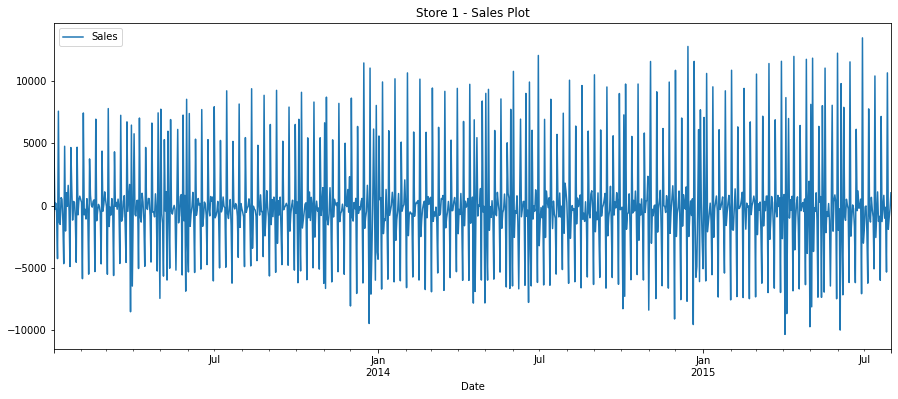

In [198]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

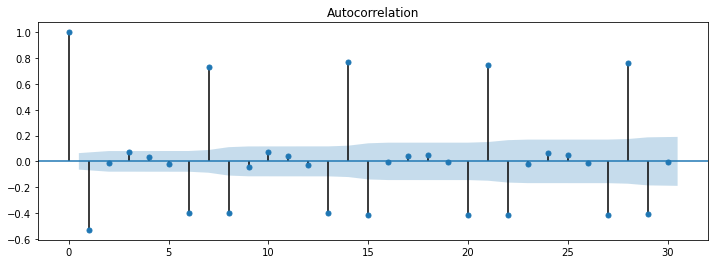

In [199]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

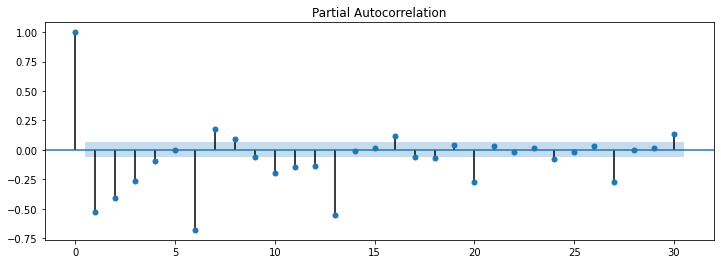

In [200]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 5 as per above PACF plot

In [201]:
AR = 5
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [202]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [203]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(5)   Log Likelihood              -13018.403
Date:                    Fri, 08 Apr 2022   AIC                          26082.806
Time:                            06:55:15   BIC                          26193.236
Sample:                        01-02-2013   HQIC                         26124.994
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1913.86, 296.63   Jarque-Bera (JB):       164.90, 256.27
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.66, 1.91   Skew:                     -1.02, -0.44
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   3.47, 5.46


### Recover original time series

In [204]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

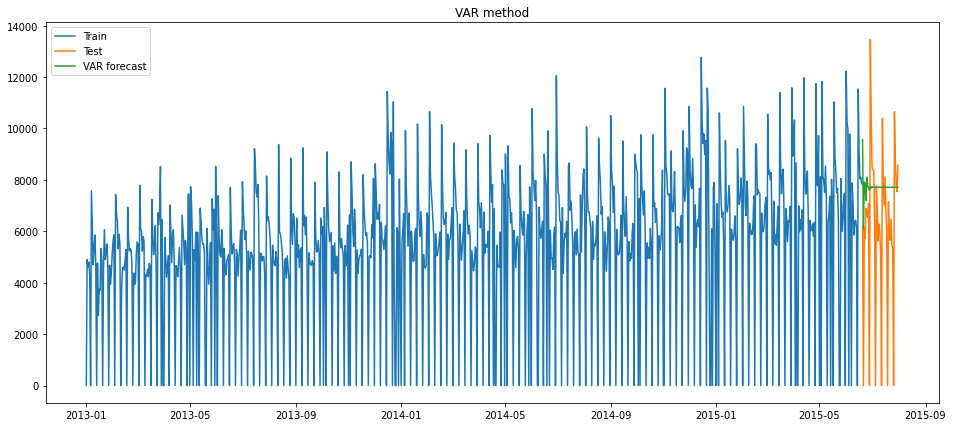

In [205]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [206]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3306.19,21.17


## Cointegration - Johansen Test

In [207]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1200.485955  6848.665633
1   1024.845444  5648.179678
2    843.091026  4623.334234
3    830.069658  3780.243208
4    726.107442  2950.173550
5    660.591958  2224.066107
6    630.169132  1563.474150
7    425.942609   933.305018
8    278.327650   507.362409
9    229.034759   229.034759 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [208]:
train_data_diff.shape

(899, 10)

In [209]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
Date,,,,,,,,,,
2013-01-02,1.0,4903.0,481.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-301.0,-28.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,196.0,44.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,-544.0,-47.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-4254.0,-450.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [210]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [211]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -12891.955
Date:                    Fri, 08 Apr 2022   AIC                          25837.909
Time:                            06:55:52   BIC                          25967.544
Sample:                        01-02-2013   HQIC                         25887.433
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             2500.83, 780.99   Jarque-Bera (JB):         27.30, 24.84
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.80, 1.01   Skew:                       0.42, 0.35
Prob(H) (two-sided):            0.05, 0.92   Kurtosis:                   3.11, 3.43


### Recover original time series

In [212]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

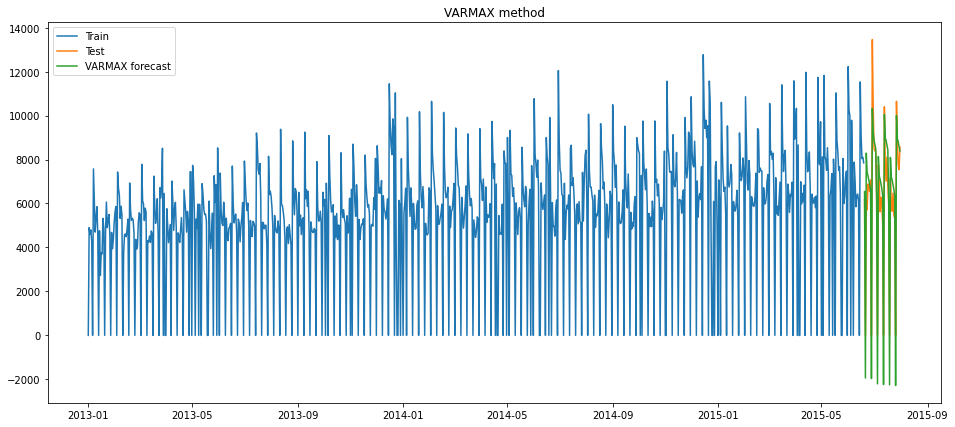

In [213]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [214]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3306.19,21.17
0,VARMAX method,1291.23,12.25


## ARIMA Model

In [215]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(5, 1, 2)   Log Likelihood               -8374.084
Method:                       css-mle   S.D. of innovations           2675.208
Date:                Fri, 08 Apr 2022   AIC                          16766.168
Time:                        06:55:54   BIC                          16809.380
Sample:                    01-02-2013   HQIC                         16782.676
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             2.3946      0.310      7.730      0.000       1.787       3.002
ar.L1.D.Sales    -0.9175      0.041    -22.373      0.000      -0.998      -0.837
ar.L2.D.Sales    -0.2117      0.045     

### Recover original time series

In [216]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

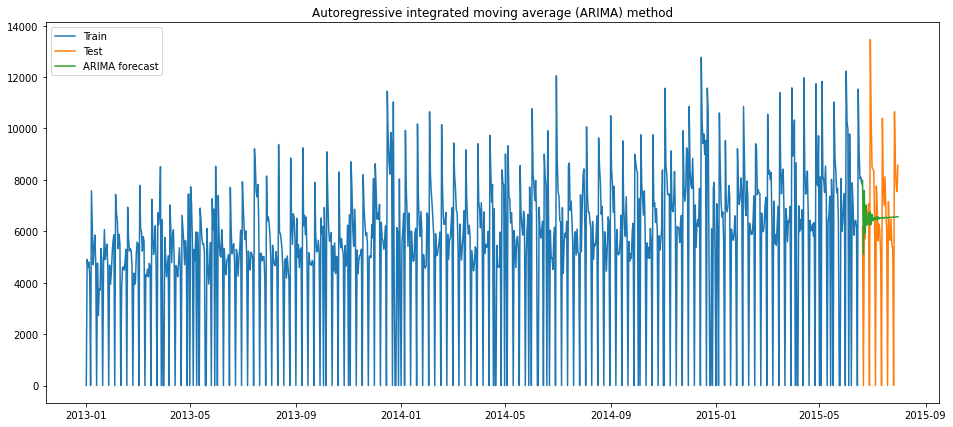

In [217]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [218]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3306.19,21.17
0,VARMAX method,1291.23,12.25
0,ARIMA method,2970.27,16.74


## SARIMA Model

In [219]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(5, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7970.530
Date:                           Fri, 08 Apr 2022   AIC                          15961.060
Time:                                   06:56:07   BIC                          16008.994
Sample:                               01-01-2013   HQIC                         15979.379
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0800      0.075     14.456      0.000       0.934       1.226
ar.L2          0.1381      0.084      1.647

### Recover original time series

In [220]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

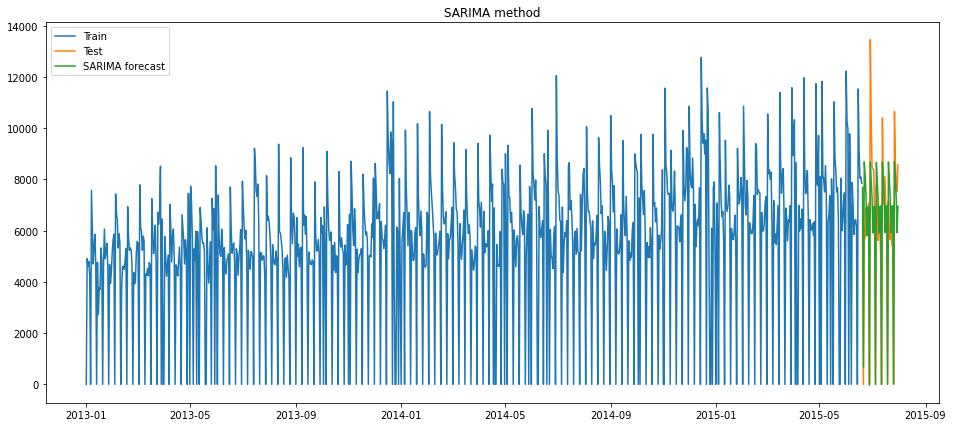

In [221]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [222]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3306.19,21.17
0,VARMAX method,1291.23,12.25
0,ARIMA method,2970.27,16.74
0,SARIMA method,1531.99,18.87


## SARIMAX Model

In [223]:
train_data.shape

(900, 10)

In [224]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [225]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(5, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7346.895
Date:                           Fri, 08 Apr 2022   AIC                          14729.790
Time:                                   06:56:28   BIC                          14816.072
Sample:                               01-01-2013   HQIC                         14762.765
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       52.8696      6.592      8.020      0.000      39.949      65.790
Promo          2126.2917    163.87

### Recover original time series

In [226]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

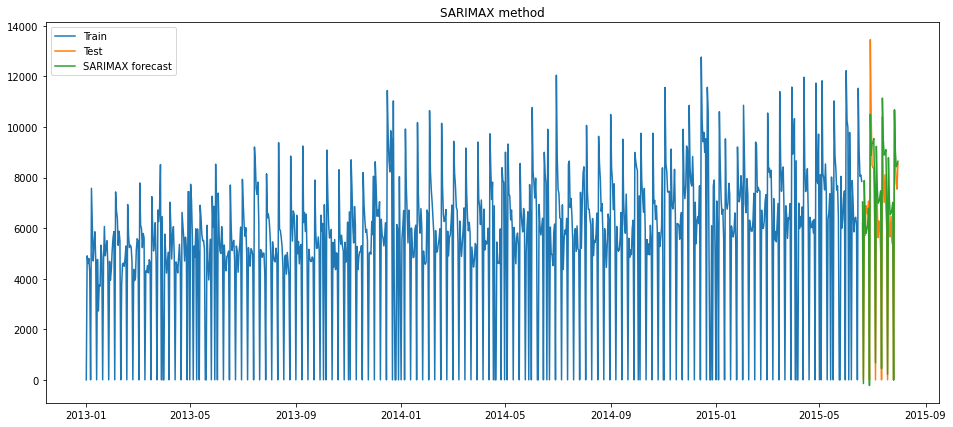

In [227]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [228]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3306.19,21.17
0,VARMAX method,1291.23,12.25
0,ARIMA method,2970.27,16.74
0,SARIMA method,1531.99,18.87
0,SARIMAX method,1207.02,16.23


## Best Model is VARMAX

## Impulse Response Function

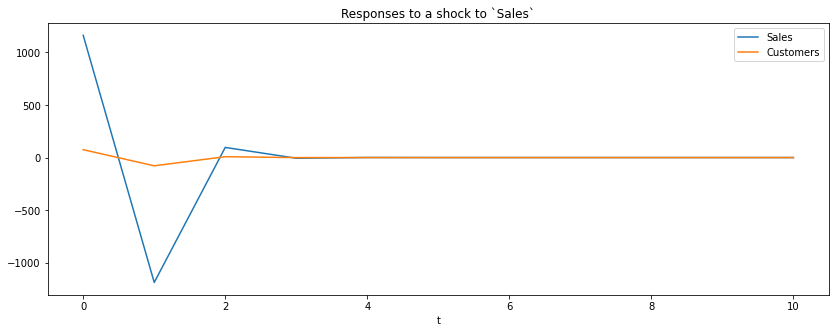

In [229]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [230]:
results_summary.append(results)
models_summary.append(models)

# Store 13

In [231]:
store = ts_master_ds[ts_master_ds['Store']==13]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,13,1,0,0,0,0,1,1,4,1,310.0,9.0,2000.0,1,45.0,2009.0,"Feb,May,Aug,Nov",1,1,1
2013-01-02,13,2,3737,317,1,0,0,1,4,1,310.0,9.0,2000.0,1,45.0,2009.0,"Feb,May,Aug,Nov",1,2,1
2013-01-03,13,3,3674,292,1,0,0,1,4,1,310.0,9.0,2000.0,1,45.0,2009.0,"Feb,May,Aug,Nov",1,3,1
2013-01-04,13,4,3848,340,1,0,0,1,4,1,310.0,9.0,2000.0,1,45.0,2009.0,"Feb,May,Aug,Nov",1,4,1
2013-01-05,13,5,4285,344,1,0,0,0,4,1,310.0,9.0,2000.0,1,45.0,2009.0,"Feb,May,Aug,Nov",1,5,1


In [232]:
store.shape

(758, 20)

In [233]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [234]:
store.shape

(758, 10)

In [235]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

Data for 184 days is missing
Handling missing data
After handling, Data for 0 days is missing


## Plot Sales data

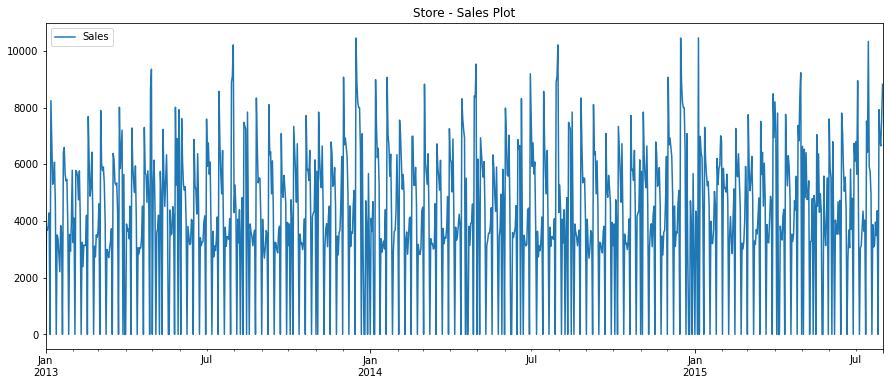

In [236]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

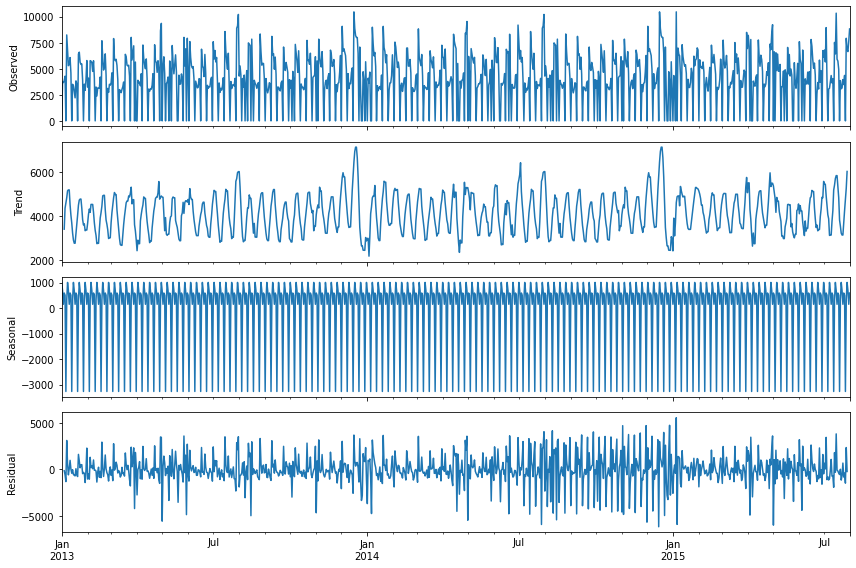

In [237]:
from pylab import rcParams
import statsmodels.api as sm

try :
  rcParams['figure.figsize'] = 12, 8
  decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
  fig = decomposition.plot()
  plt.show()
except :
  print("Could not plot Additive Seasonal Decomposition plot")

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [238]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.3456
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.2241
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Lev

In [239]:
# 1st difference
store_diff = store.diff().dropna()

In [240]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -11.72
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -12.9824
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Lev

All Columns are now stationary

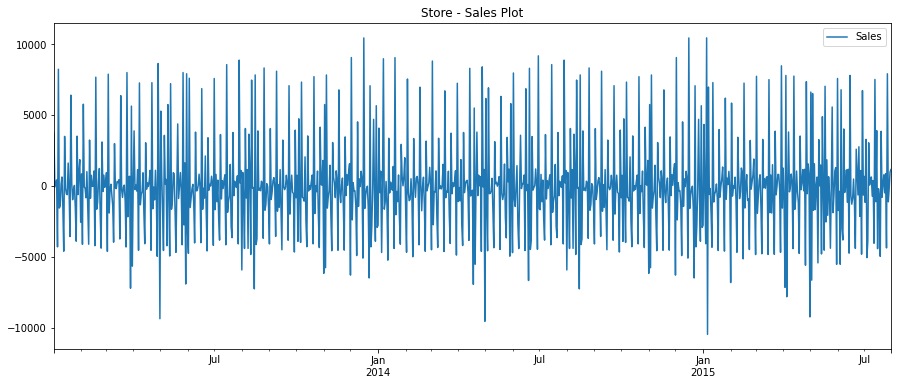

In [241]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

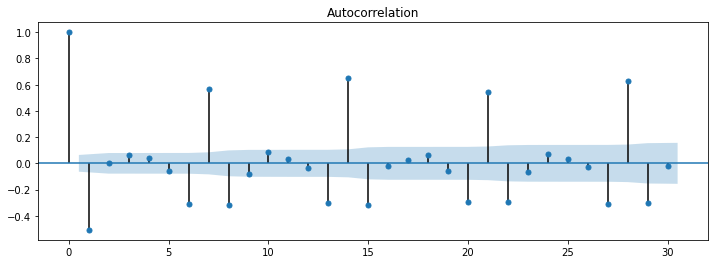

In [242]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

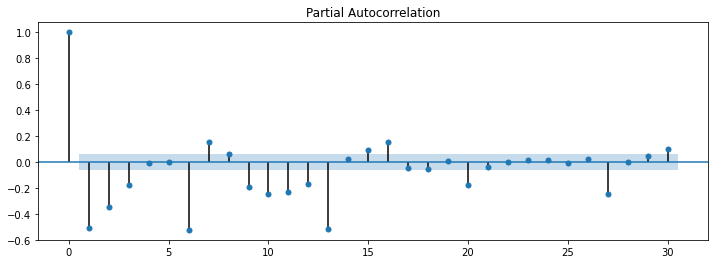

In [243]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 4 as per above PACF plot

In [244]:
AR = 4
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [245]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [246]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(4)   Log Likelihood              -12703.541
Date:                    Fri, 08 Apr 2022   AIC                          25445.083
Time:                            06:56:36   BIC                          25536.307
Sample:                        01-02-2013   HQIC                         25479.933
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              940.62, 489.77   Jarque-Bera (JB):          61.00, 2.71
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.26
Heteroskedasticity (H):         1.22, 1.20   Skew:                     -0.64, -0.12
Prob(H) (two-sided):            0.08, 0.11   Kurtosis:                   2.96, 2.90


### Recover original time series

In [247]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

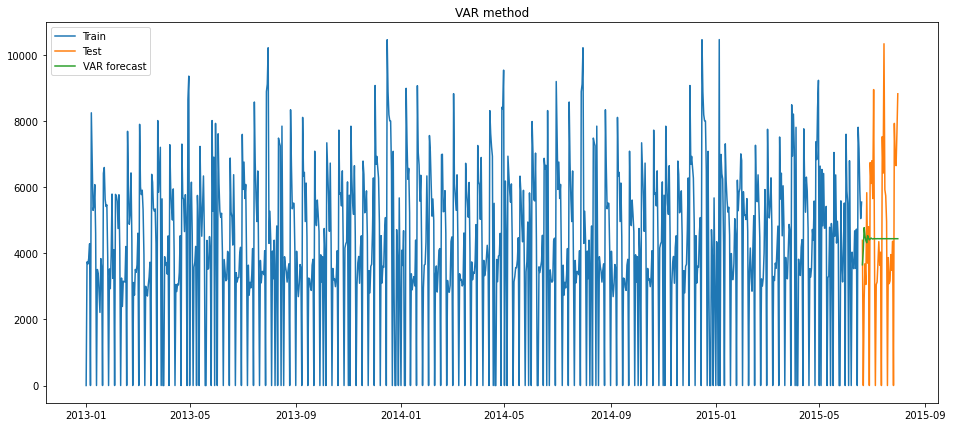

In [248]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [249]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2563.68,29.89


## Cointegration - Johansen Test

In [250]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat    trace_stat
0   8690.565808  14648.567589
1   1276.267673   5958.001780
2    980.356800   4681.734107
3    850.106766   3701.377308
4    725.987263   2851.270541
5    690.956877   2125.283279
6    591.250140   1434.326402
7    418.139055    843.076262
8    233.492660    424.937208
9    191.444547    191.444547 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 

Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [251]:
train_data_diff.shape

(899, 10)

In [252]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
2013-01-02,1.0,3737.0,317.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-63.0,-25.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,174.0,48.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,437.0,4.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-4285.0,-344.0,-1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [253]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [254]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -11855.145
Date:                    Fri, 08 Apr 2022   AIC                          23764.291
Time:                            06:57:57   BIC                          23893.925
Sample:                        01-02-2013   HQIC                         23813.815
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1309.34, 166.56   Jarque-Bera (JB):          2.83, 79.04
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.24, 0.00
Heteroskedasticity (H):         1.12, 1.74   Skew:                     -0.06, -0.08
Prob(H) (two-sided):            0.32, 0.00   Kurtosis:                   3.24, 4.44


### Recover original time series

In [255]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

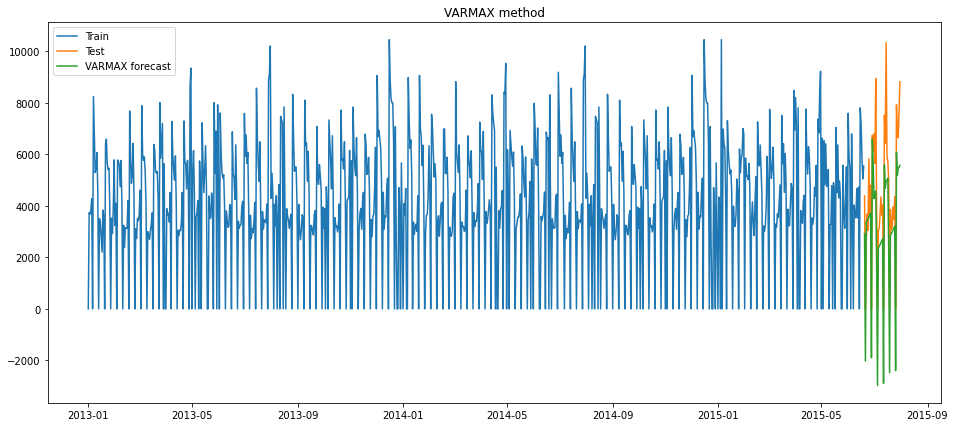

In [256]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [257]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2563.68,29.89
0,VARMAX method,1929.49,25.24


## ARIMA Model

In [258]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -8277.455
Method:                       css-mle   S.D. of innovations           2403.594
Date:                Fri, 08 Apr 2022   AIC                          16570.911
Time:                        06:57:58   BIC                          16609.321
Sample:                    01-02-2013   HQIC                         16585.585
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.3139      0.339      0.926      0.355      -0.350       0.978
ar.L1.D.Sales    -0.7806      0.052    -14.925      0.000      -0.883      -0.678
ar.L2.D.Sales     0.0507      0.042     

### Recover original time series

In [259]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

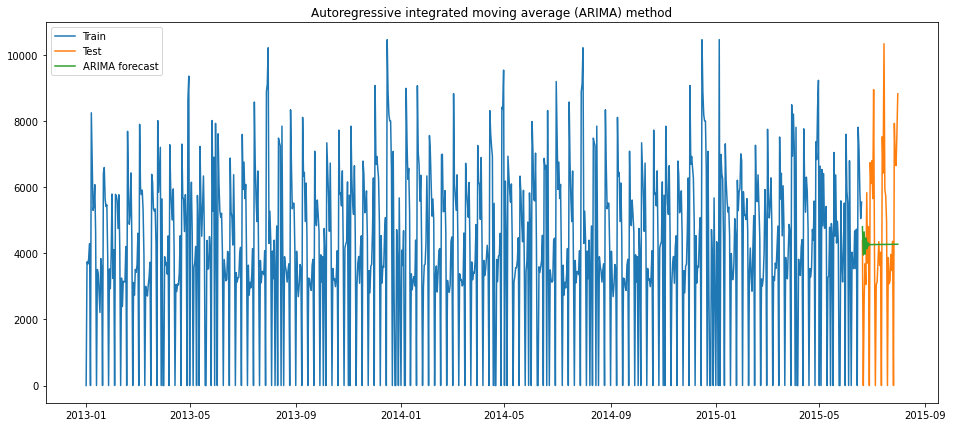

In [260]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [261]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2563.68,29.89
0,VARMAX method,1929.49,25.24
0,ARIMA method,2576.41,28.90


## SARIMA Model

In [262]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7927.651
Date:                           Fri, 08 Apr 2022   AIC                          15873.302
Time:                                   06:58:11   BIC                          15916.443
Sample:                               01-01-2013   HQIC                         15889.789
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0054      0.027     37.250      0.000       0.953       1.058
ar.L2          0.1331      0.034      3.884

### Recover original time series

In [263]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

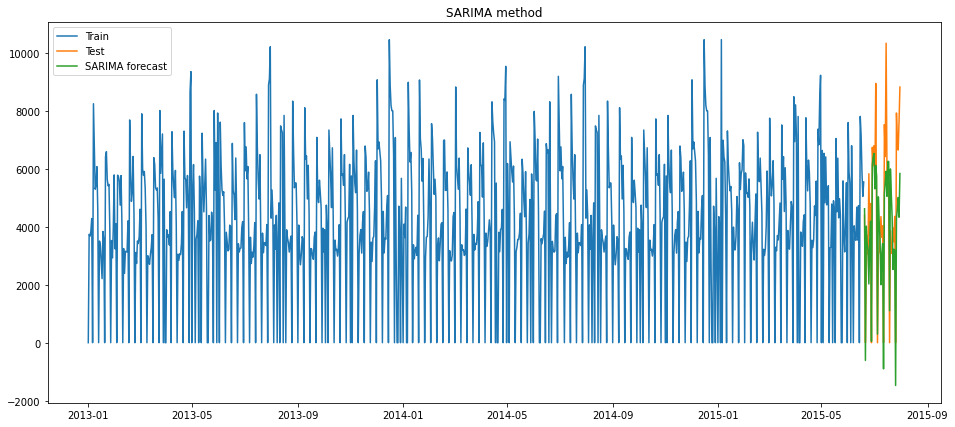

In [264]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [265]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2563.68,29.89
0,VARMAX method,1929.49,25.24
0,ARIMA method,2576.41,28.90
0,SARIMA method,1745.32,27.57


## SARIMAX Model

In [266]:
train_data.shape

(900, 10)

In [267]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [268]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7408.602
Date:                           Fri, 08 Apr 2022   AIC                          14851.203
Time:                                   06:58:50   BIC                          14932.692
Sample:                               01-01-2013   HQIC                         14882.346
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear        9.4136     20.961      0.449      0.653     -31.669      50.497
Promo          2951.8056    154.89

### Recover original time series

In [269]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

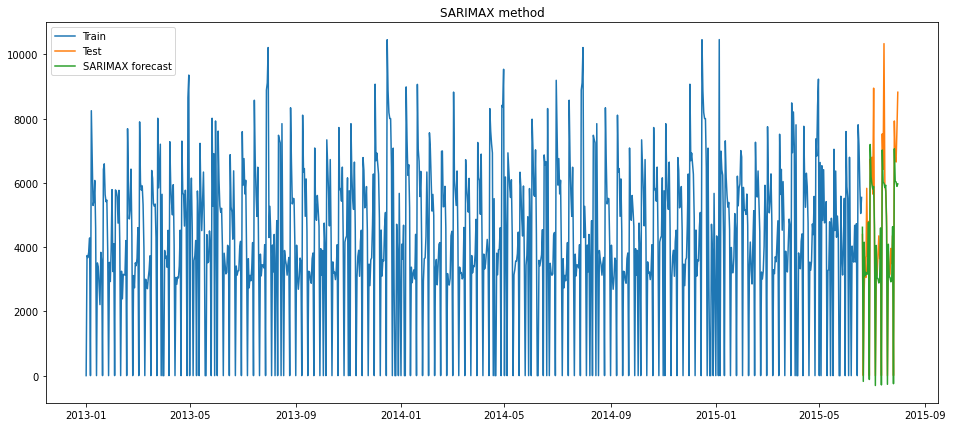

In [270]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [271]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2563.68,29.89
0,VARMAX method,1929.49,25.24
0,ARIMA method,2576.41,28.90
0,SARIMA method,1745.32,27.57
0,SARIMAX method,1191.93,15.28


## Best Model is SARIMAX

## Impulse Response Function

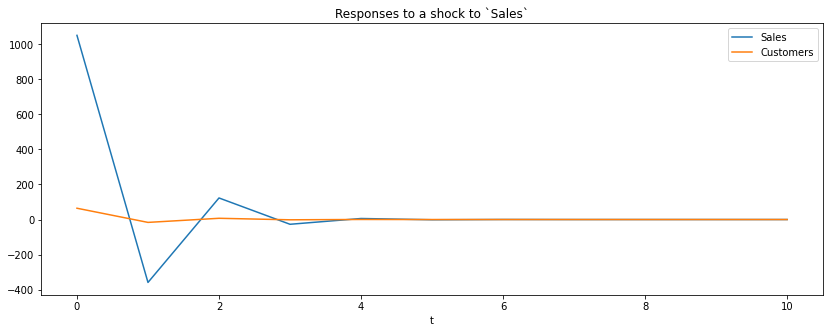

In [272]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [273]:
results_summary.append(results)
models_summary.append(models)

# Store 25

In [274]:
store = ts_master_ds[ts_master_ds['Store']==25]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,25,1,0,0,0,0,1,1,3,1,430.0,4.0,2003.0,0,0.0,0.0,0,1,1,1
2013-01-02,25,2,11944,1698,1,0,0,1,3,1,430.0,4.0,2003.0,0,0.0,0.0,0,1,2,1
2013-01-03,25,3,10409,1587,1,0,0,1,3,1,430.0,4.0,2003.0,0,0.0,0.0,0,1,3,1
2013-01-04,25,4,9729,1520,1,0,0,1,3,1,430.0,4.0,2003.0,0,0.0,0.0,0,1,4,1
2013-01-05,25,5,8987,1381,1,0,0,0,3,1,430.0,4.0,2003.0,0,0.0,0.0,0,1,5,1


In [275]:
store.shape

(877, 20)

In [276]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [277]:
store.shape

(877, 10)

In [278]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if '2015-06-04' day data is missing, we will impute with '2014-06-04' day data


start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]


  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

Data for 65 days is missing
Handling missing data
After handling, Data for 43 days is missing


In [279]:
# Still we are having some missing data/rows, we will impute them with previous row data, for eg, if data for day '2015-06-04' is missing, we will impute it
# with data of day '2015-06-03'

store = store.reindex(pd.date_range(start, end))
store.fillna(method='pad', inplace=True)

In [280]:
store.shape

(942, 10)

## Plot Sales data

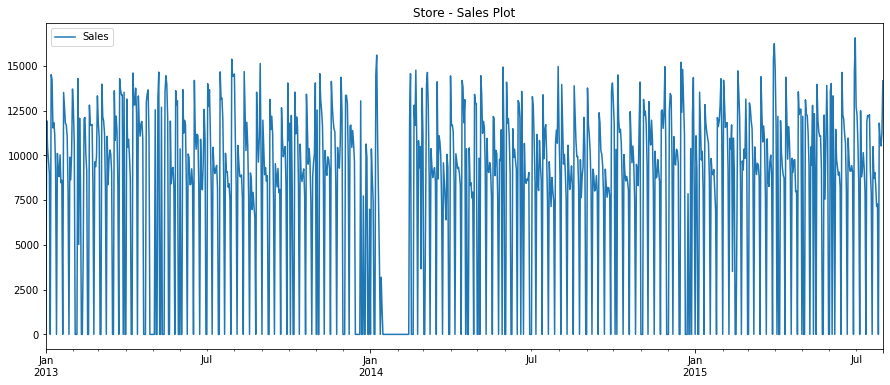

In [281]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

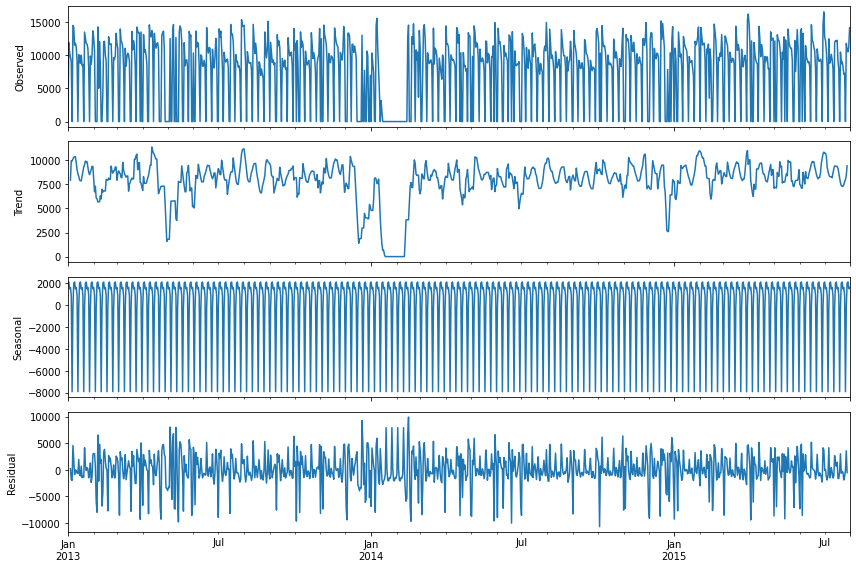

In [282]:
from pylab import rcParams
import statsmodels.api as sm

try :
  rcParams['figure.figsize'] = 12, 8
  decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
  fig = decomposition.plot()
  plt.show()
except :
  print("Could not plot Additive Seasonal Decomposition plot")

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [283]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.6072
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0001. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.7769
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0032. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significan

In [284]:
# 1st difference
store_diff = store.diff().dropna()

In [285]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.8711
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -11.5493
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance L

All Columns are now stationary

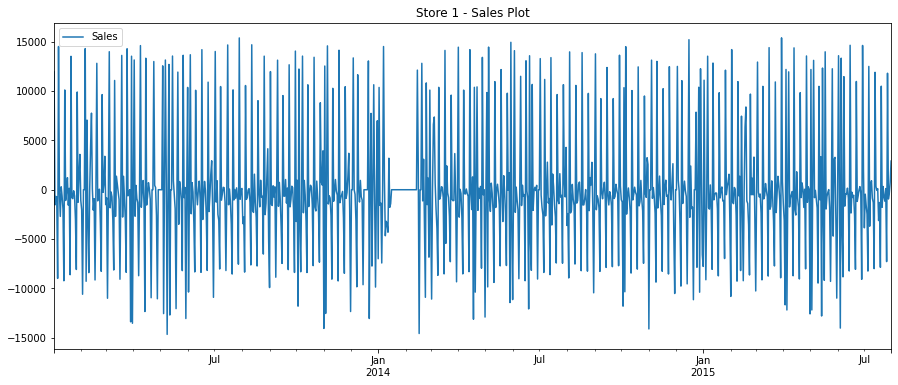

In [286]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

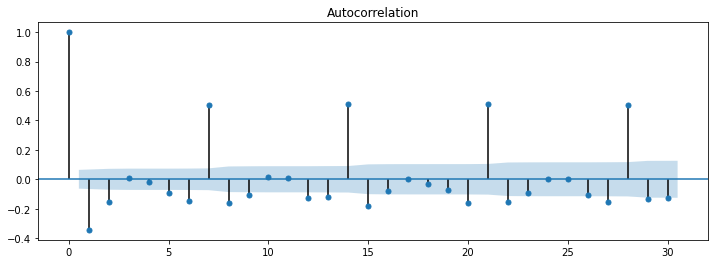

In [287]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

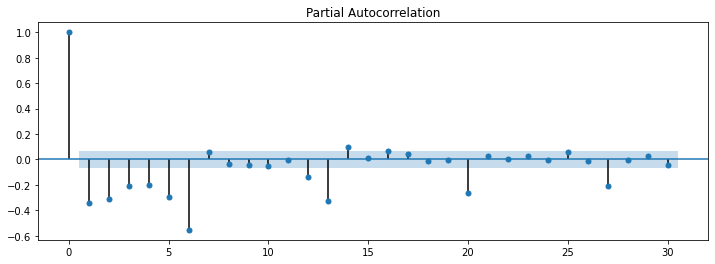

In [288]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 7 as per above PACF plot

In [289]:
AR = 7
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [290]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [291]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(7)   Log Likelihood              -13981.691
Date:                    Fri, 08 Apr 2022   AIC                          28025.382
Time:                            06:59:44   BIC                          28174.222
Sample:                        01-02-2013   HQIC                         28082.243
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              130.90, 203.64   Jarque-Bera (JB):        50.98, 301.90
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.93, 1.07   Skew:                     -0.15, -0.39
Prob(H) (two-sided):            0.51, 0.57   Kurtosis:                   4.13, 5.73


### Recover original time series

In [292]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

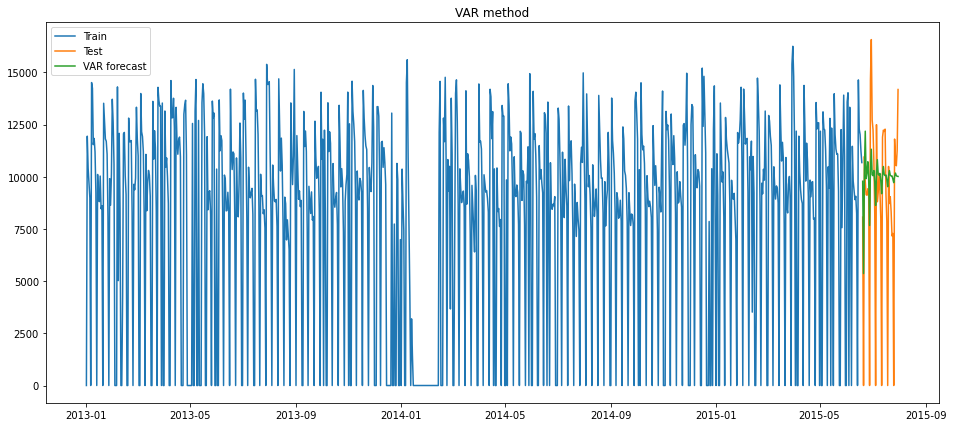

In [293]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [294]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3728.96,16.55


## Cointegration - Johansen Test

In [295]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1055.249565  6433.637743
1   1013.156479  5378.388178
2    892.162148  4365.231699
3    726.648417  3473.069550
4    658.347135  2746.421133
5    618.503173  2088.073998
6    475.397629  1469.570826
7    423.820787   994.173196
8    310.859567   570.352410
9    259.492843   259.492843 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [296]:
train_data_diff.shape

(899, 10)

In [297]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
2013-01-02,1.0,11944.0,1698.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-1535.0,-111.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,-680.0,-67.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,-742.0,-139.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-8987.0,-1381.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [298]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [299]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -13465.574
Date:                    Fri, 08 Apr 2022   AIC                          26985.148
Time:                            07:00:46   BIC                          27114.782
Sample:                        01-02-2013   HQIC                         27034.672
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              939.71, 256.98   Jarque-Bera (JB):        68.16, 749.28
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.09, 1.30   Skew:                      0.01, -1.06
Prob(H) (two-sided):            0.46, 0.02   Kurtosis:                   4.35, 6.94


### Recover original time series

In [300]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

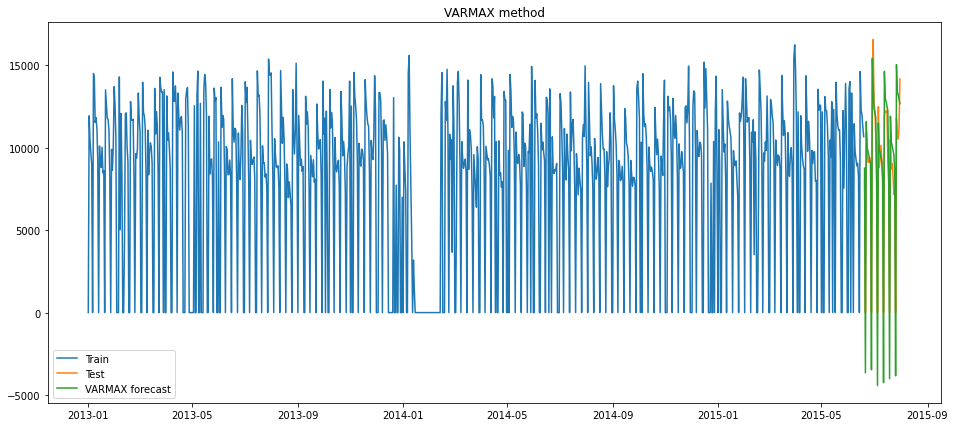

In [301]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [302]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3728.96,16.55
0,VARMAX method,2024.33,11.15


## ARIMA Model

In [303]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(7, 1, 2)   Log Likelihood               -8791.959
Method:                       css-mle   S.D. of innovations           4258.573
Date:                Fri, 08 Apr 2022   AIC                          17605.917
Time:                        07:00:56   BIC                          17658.731
Sample:                    01-02-2013   HQIC                         17626.094
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.9109      1.142      0.797      0.425      -1.328       3.150
ar.L1.D.Sales     0.0290      0.057      0.509      0.611      -0.083       0.141
ar.L2.D.Sales    -0.0329      0.031     

### Recover original time series

In [304]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

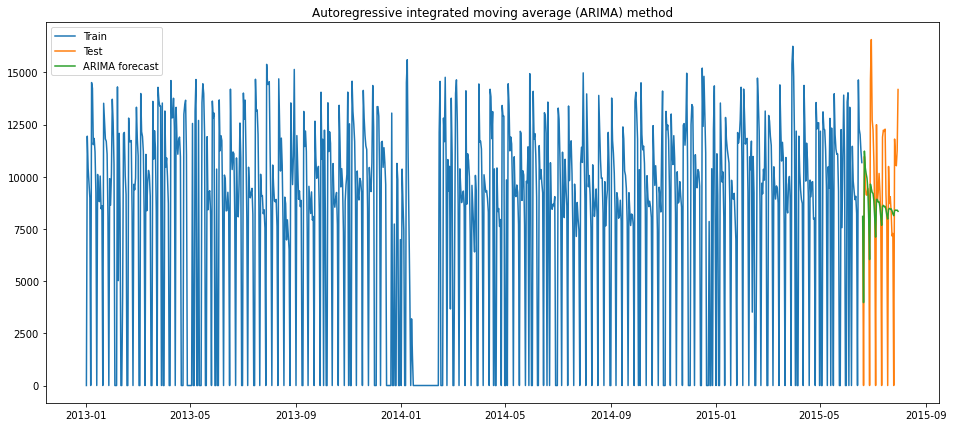

In [305]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [306]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3728.96,16.55
0,VARMAX method,2024.33,11.15
0,ARIMA method,3565.16,16.02


## SARIMA Model

In [307]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(7, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -8645.895
Date:                           Fri, 08 Apr 2022   AIC                          17315.789
Time:                                   07:01:16   BIC                          17373.311
Sample:                               01-01-2013   HQIC                         17337.773
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0757      0.314     -0.241      0.809      -0.691       0.539
ar.L2          0.0016      0.098      0.016

### Recover original time series

In [308]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

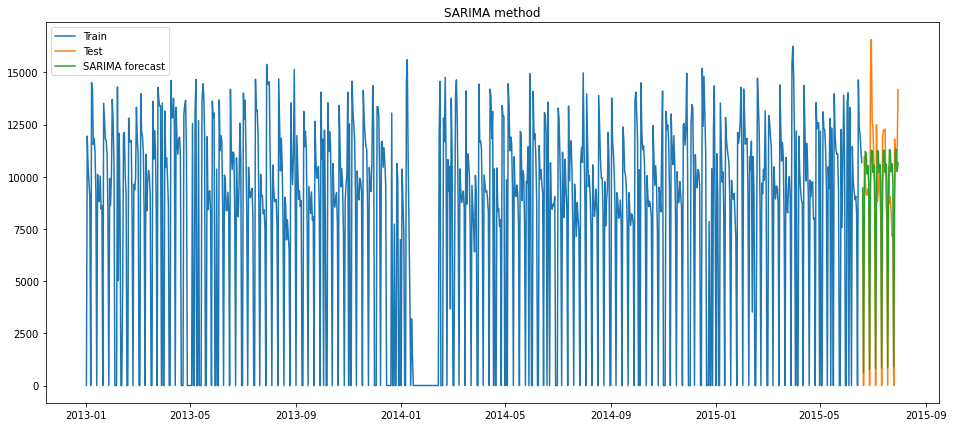

In [309]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [310]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3728.96,16.55
0,VARMAX method,2024.33,11.15
0,ARIMA method,3565.16,16.02
0,SARIMA method,2096.43,18.42


## SARIMAX Model

In [311]:
train_data.shape

(900, 10)

In [312]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [313]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(7, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7811.062
Date:                           Fri, 08 Apr 2022   AIC                          15662.124
Time:                                   07:01:46   BIC                          15757.993
Sample:                               01-01-2013   HQIC                         15698.762
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       33.6868     19.296      1.746      0.081      -4.132      71.506
Promo          2220.1090    244.74

### Recover original time series

In [314]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

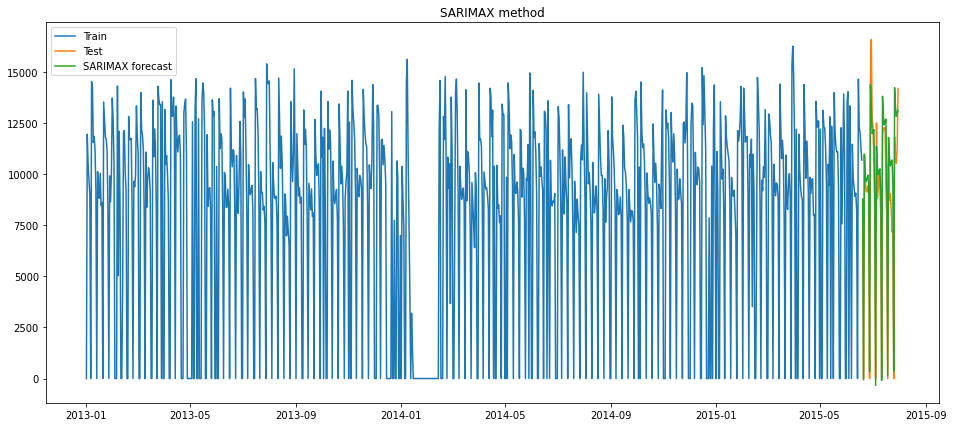

In [315]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [316]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3728.96,16.55
0,VARMAX method,2024.33,11.15
0,ARIMA method,3565.16,16.02
0,SARIMA method,2096.43,18.42
0,SARIMAX method,1486.42,13.02


## Best Model is VARMAX

## Impulse Response Function

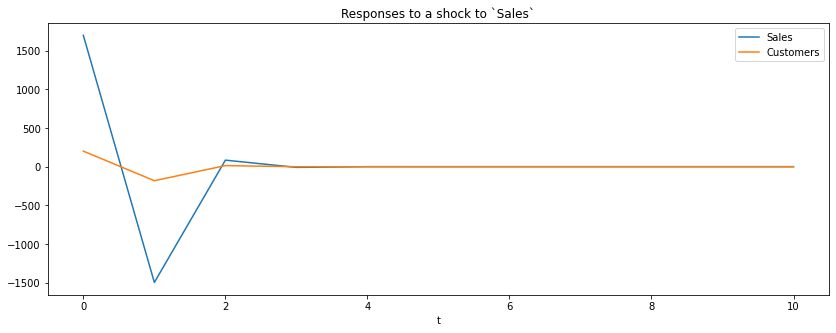

In [317]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [318]:
results_summary.append(results)
models_summary.append(models)

# Store 29

In [319]:
store = ts_master_ds[ts_master_ds['Store']==29]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,29,1,0,0,0,0,1,1,4,3,2170.0,9.0,2000.0,0,0.0,0.0,0,1,1,1
2013-01-02,29,2,5269,550,1,0,0,1,4,3,2170.0,9.0,2000.0,0,0.0,0.0,0,1,2,1
2013-01-03,29,3,4554,456,1,0,0,1,4,3,2170.0,9.0,2000.0,0,0.0,0.0,0,1,3,1
2013-01-04,29,4,5411,505,1,0,0,1,4,3,2170.0,9.0,2000.0,0,0.0,0.0,0,1,4,1
2013-01-05,29,5,5564,537,1,0,0,0,4,3,2170.0,9.0,2000.0,0,0.0,0.0,0,1,5,1


In [320]:
store.shape

(942, 20)

In [321]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [322]:
store.shape

(942, 10)

In [323]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

No Data missing


## Plot Sales data

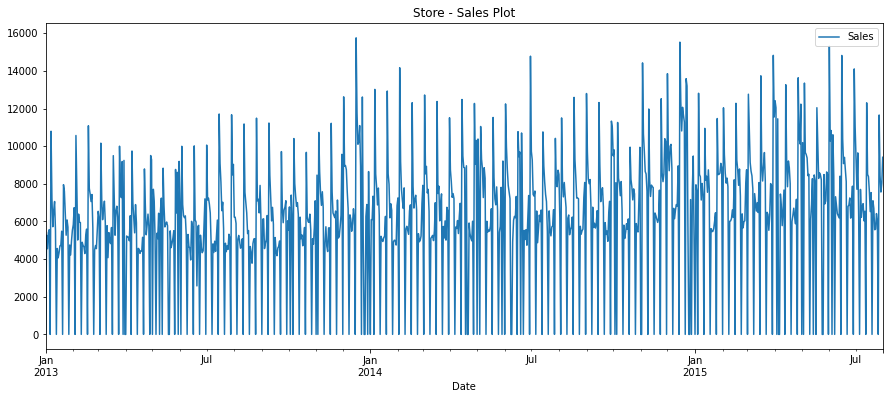

In [324]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

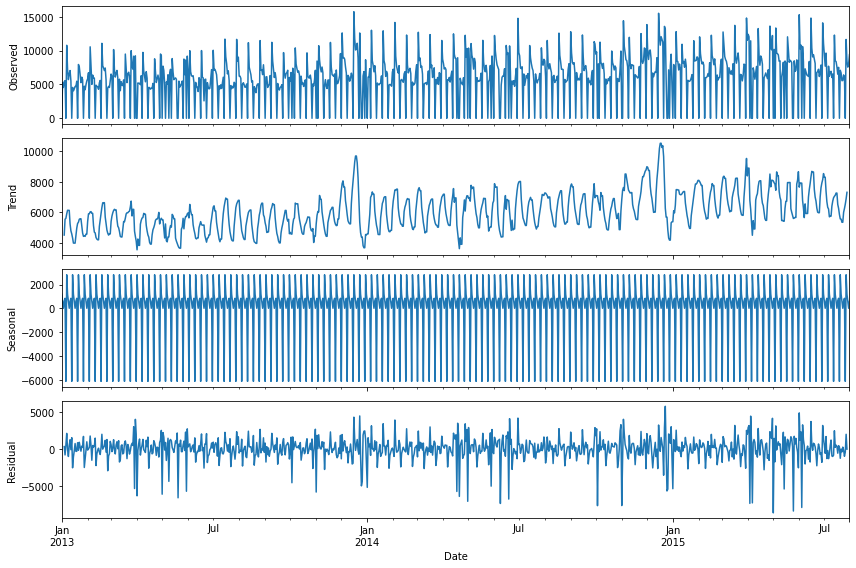

In [325]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [326]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.0
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.9585. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.4245
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0102. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stati

In [327]:
# 1st difference
store_diff = store.diff().dropna()

In [328]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.0169971764429466e+16
 No. Lags Chosen       = 11
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -12.7493
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.


All Columns are now stationary

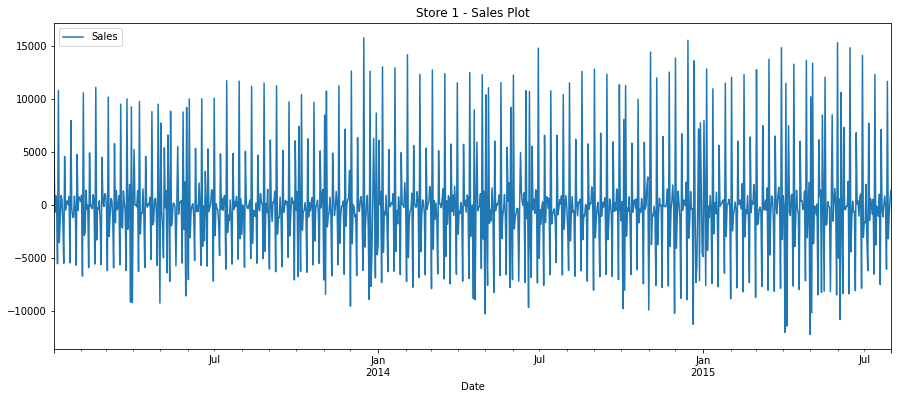

In [329]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

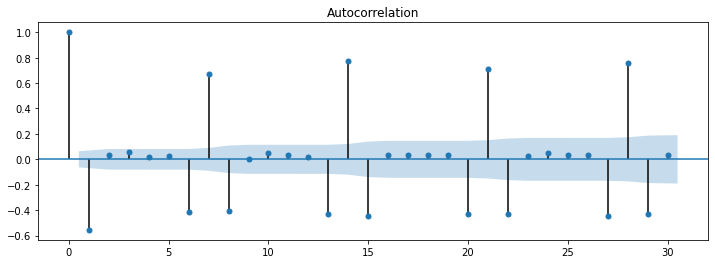

In [330]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

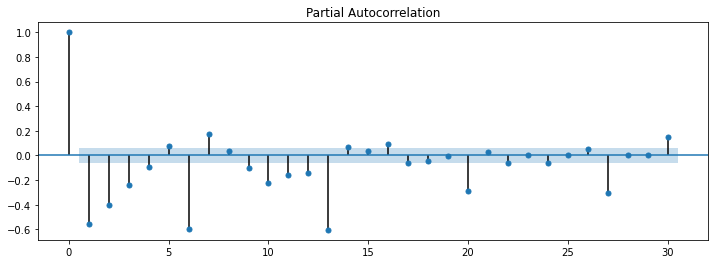

In [331]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 5 as per above PACF plot

In [332]:
AR = 5
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [333]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [334]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(5)   Log Likelihood              -13291.309
Date:                    Fri, 08 Apr 2022   AIC                          26628.617
Time:                            07:01:56   BIC                          26739.047
Sample:                        01-02-2013   HQIC                         26670.804
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1073.07, 433.32   Jarque-Bera (JB):        75.92, 148.61
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.96, 1.48   Skew:                     -0.69, -0.59
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   3.37, 4.60


### Recover original time series

In [335]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

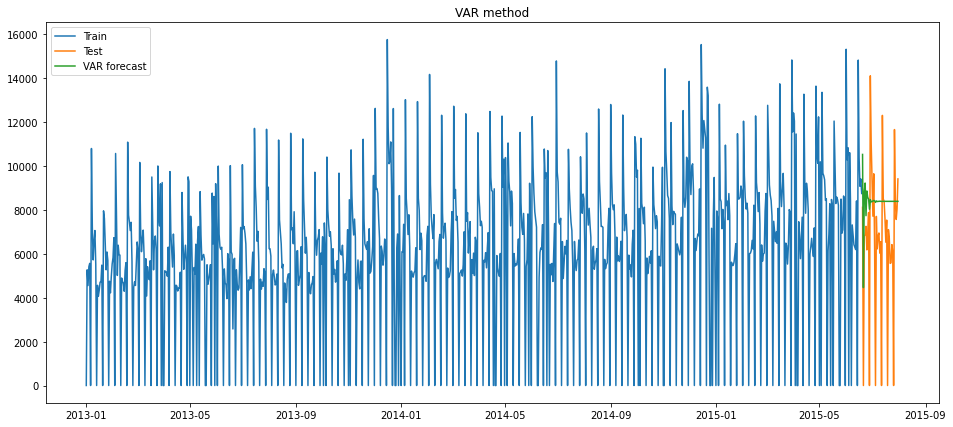

In [336]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [337]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3514.67,22.62


## Cointegration - Johansen Test

In [338]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1290.998670  6894.801897
1   1044.175027  5603.803227
2    873.480821  4559.628200
3    767.607786  3686.147379
4    722.183640  2918.539593
5    644.493558  2196.355953
6    628.954488  1551.862395
7    430.707134   922.907907
8    273.239548   492.200773
9    218.961226   218.961226 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [339]:
train_data_diff.shape

(899, 10)

In [340]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
Date,,,,,,,,,,
2013-01-02,1.0,5269.0,550.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,-715.0,-94.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,857.0,49.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,153.0,32.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-5564.0,-537.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [341]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [342]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -12658.489
Date:                    Fri, 08 Apr 2022   AIC                          25370.979
Time:                            07:02:34   BIC                          25500.613
Sample:                        01-02-2013   HQIC                         25420.503
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1370.47, 356.29   Jarque-Bera (JB):         69.07, 20.90
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.65, 0.94   Skew:                     -0.41, -0.02
Prob(H) (two-sided):            0.00, 0.61   Kurtosis:                   4.08, 3.75


### Recover original time series

In [343]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

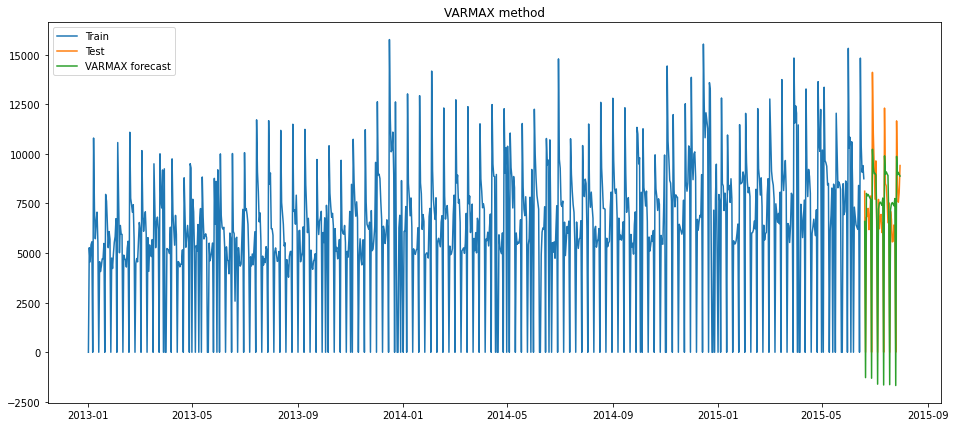

In [344]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [345]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3514.67,22.62
0,VARMAX method,1409.14,15.35


## ARIMA Model

In [346]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(5, 1, 2)   Log Likelihood               -8541.666
Method:                       css-mle   S.D. of innovations           3224.079
Date:                Fri, 08 Apr 2022   AIC                          17101.332
Time:                        07:02:36   BIC                          17144.543
Sample:                    01-02-2013   HQIC                         17117.840
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             2.6850      0.444      6.052      0.000       1.815       3.554
ar.L1.D.Sales    -0.8622      0.041    -20.922      0.000      -0.943      -0.781
ar.L2.D.Sales    -0.1021      0.044     

### Recover original time series

In [347]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

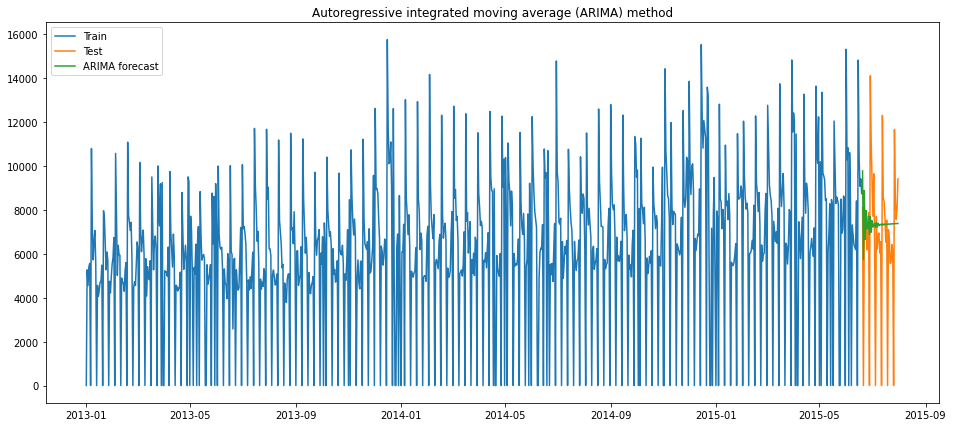

In [348]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [349]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3514.67,22.62
0,VARMAX method,1409.14,15.35
0,ARIMA method,3220.92,16.24


## SARIMA Model

In [350]:
model = SARIMAX(train_data['Sales'], order=(AR, D, 1), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(5, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -8033.394
Date:                           Fri, 08 Apr 2022   AIC                          16084.789
Time:                                   07:02:49   BIC                          16127.930
Sample:                               01-01-2013   HQIC                         16101.276
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1356      0.025      5.324      0.000       0.086       0.185
ar.L2          0.1064      0.035      3.062

### Recover original time series

In [351]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

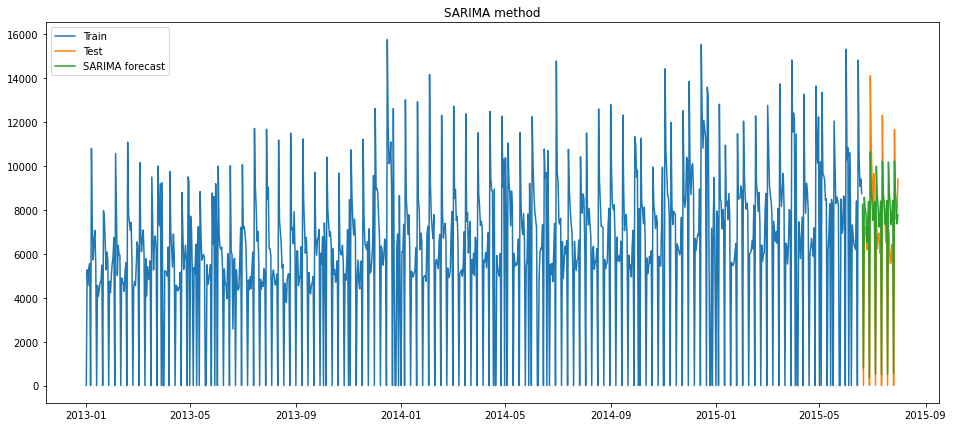

In [352]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [353]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3514.67,22.62
0,VARMAX method,1409.14,15.35
0,ARIMA method,3220.92,16.24
0,SARIMA method,1512.45,18.12


## SARIMAX Model

In [354]:
train_data.shape

(900, 10)

In [355]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [356]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(5, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7647.511
Date:                           Fri, 08 Apr 2022   AIC                          15331.023
Time:                                   07:03:12   BIC                          15417.305
Sample:                               01-01-2013   HQIC                         15363.997
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       64.6697     10.515      6.150      0.000      44.060      85.279
Promo          3475.4696    280.41

### Recover original time series

In [357]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

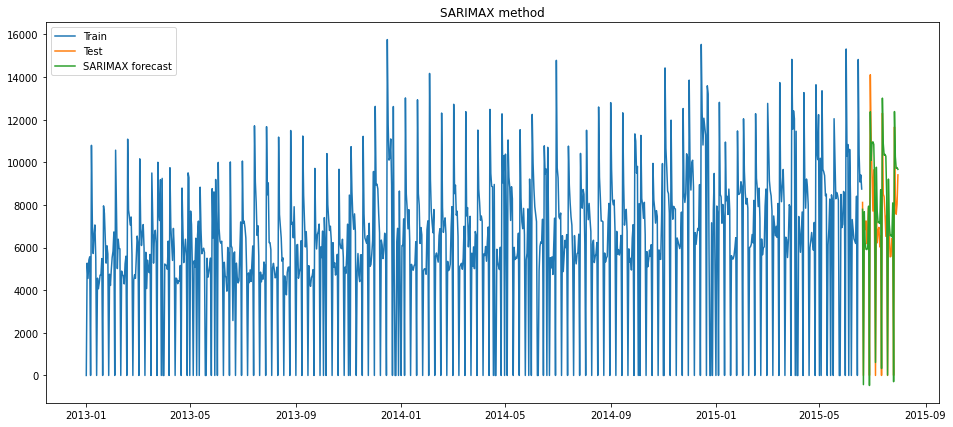

In [358]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [359]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,3514.67,22.62
0,VARMAX method,1409.14,15.35
0,ARIMA method,3220.92,16.24
0,SARIMA method,1512.45,18.12
0,SARIMAX method,1525.63,18.26


## Best Model is VARMAX

## Impulse Response Function

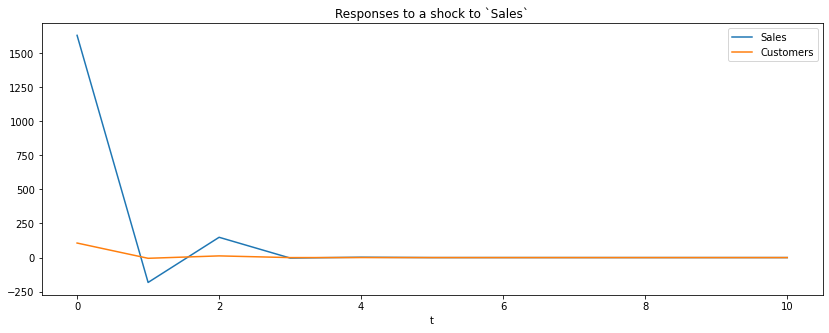

In [360]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [361]:
results_summary.append(results)
models_summary.append(models)

# Store 31

In [362]:
store = ts_master_ds[ts_master_ds['Store']==31]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,31,1,0,0,0,0,1,1,4,3,9800.0,7.0,2012.0,0,0.0,0.0,0,1,1,1
2013-01-02,31,2,5122,567,1,0,0,1,4,3,9800.0,7.0,2012.0,0,0.0,0.0,0,1,2,1
2013-01-03,31,3,5623,578,1,0,0,1,4,3,9800.0,7.0,2012.0,0,0.0,0.0,0,1,3,1
2013-01-04,31,4,6140,633,1,0,0,1,4,3,9800.0,7.0,2012.0,0,0.0,0.0,0,1,4,1
2013-01-05,31,5,5607,624,1,0,0,0,4,3,9800.0,7.0,2012.0,0,0.0,0.0,0,1,5,1


In [363]:
store.shape

(942, 20)

In [364]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [365]:
store.shape

(942, 10)

In [366]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

No Data missing


## Plot Sales data

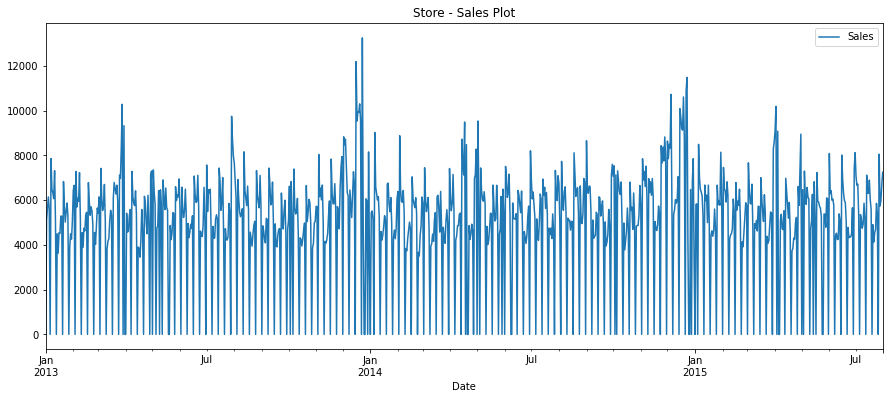

In [367]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

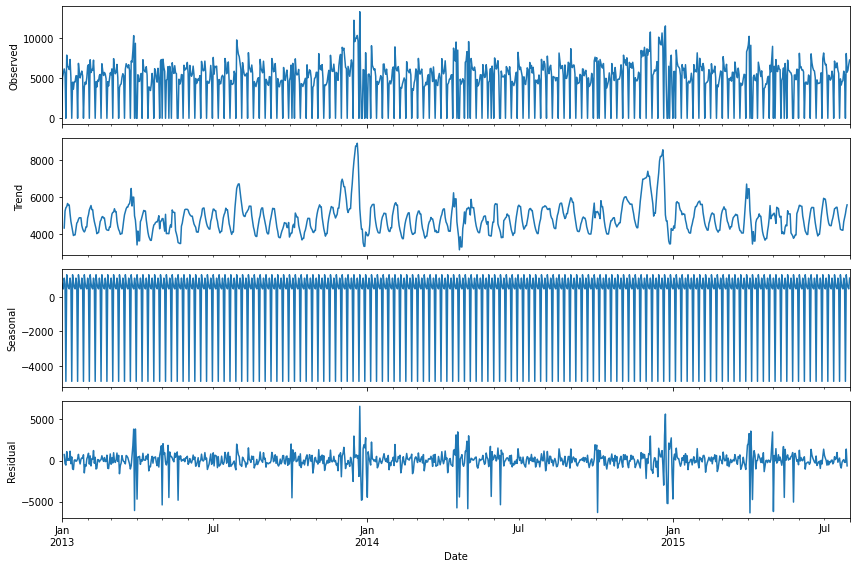

In [368]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [369]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.0
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.9585. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.8845
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationa

In [370]:
# 1st difference
store_diff = store.diff().dropna()

In [371]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.0169971764429466e+16
 No. Lags Chosen       = 11
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.136
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 

All Columns are now stationary

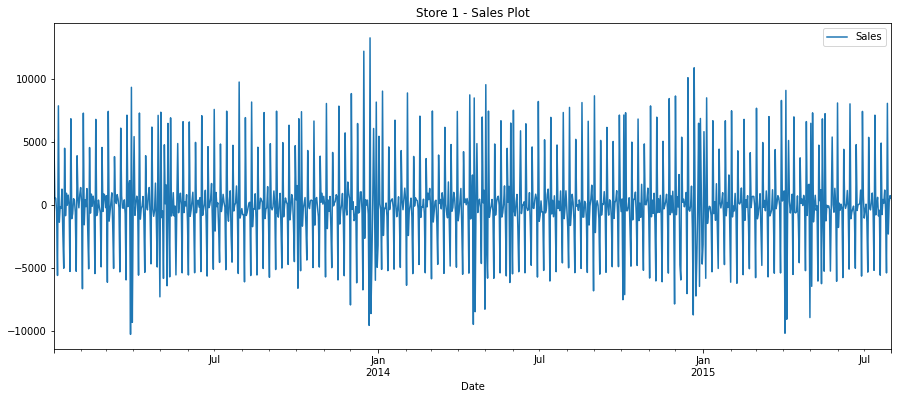

In [372]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

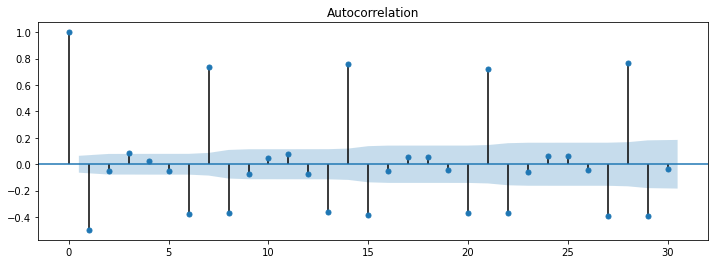

In [373]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

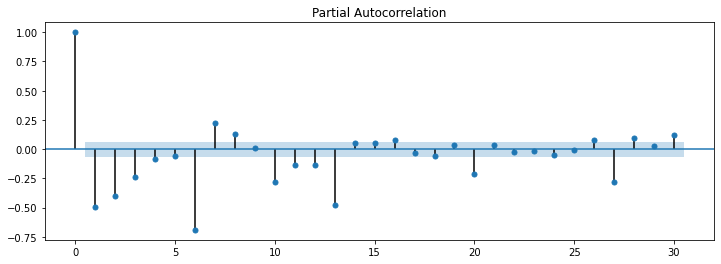

In [374]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 4 as per above PACF plot

In [375]:
AR = 4
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [376]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [377]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(4)   Log Likelihood              -13024.740
Date:                    Fri, 08 Apr 2022   AIC                          26087.480
Time:                            07:03:20   BIC                          26178.705
Sample:                        01-02-2013   HQIC                         26122.330
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             2069.12, 361.02   Jarque-Bera (JB):        156.08, 81.90
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.23, 0.98   Skew:                     -0.99, -0.27
Prob(H) (two-sided):            0.07, 0.89   Kurtosis:                   3.53, 4.38


### Recover original time series

In [378]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

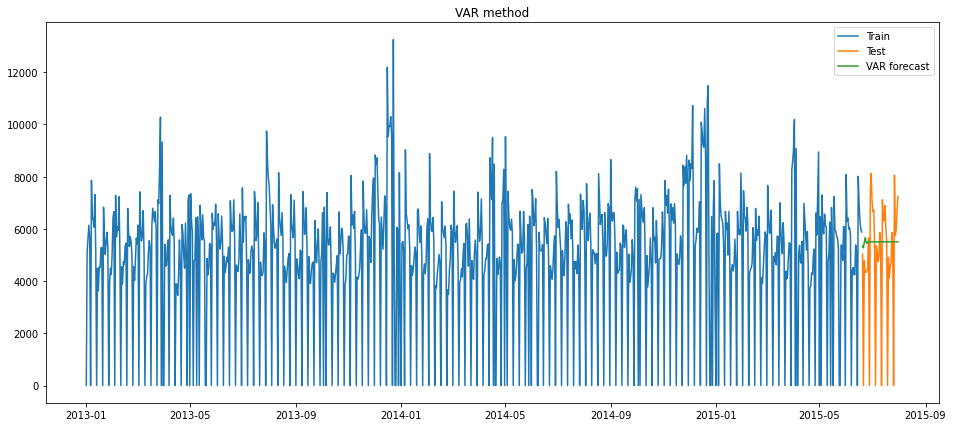

In [379]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [380]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2307.68,15.33


## Cointegration - Johansen Test

In [381]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat   trace_stat
0   1245.679953  6861.550617
1   1031.740220  5615.870665
2    880.863393  4584.130445
3    786.074134  3703.267052
4    685.947934  2917.192918
5    654.351404  2231.244984
6    641.706790  1576.893580
7    422.366703   935.186790
8    279.717038   512.820086
9    233.103048   233.103048 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 



Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [382]:
train_data_diff.shape

(899, 10)

In [383]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
Date,,,,,,,,,,
2013-01-02,1.0,5122.0,567.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,501.0,11.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,517.0,55.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,-533.0,-9.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-5607.0,-624.0,-1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [384]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [385]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -12613.736
Date:                    Fri, 08 Apr 2022   AIC                          25281.472
Time:                            07:04:00   BIC                          25411.106
Sample:                        01-02-2013   HQIC                         25330.996
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1663.32, 679.96   Jarque-Bera (JB):          16.38, 1.85
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.40
Heteroskedasticity (H):         1.03, 1.08   Skew:                      -0.01, 0.09
Prob(H) (two-sided):            0.78, 0.49   Kurtosis:                   3.66, 3.13


### Recover original time series

In [386]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

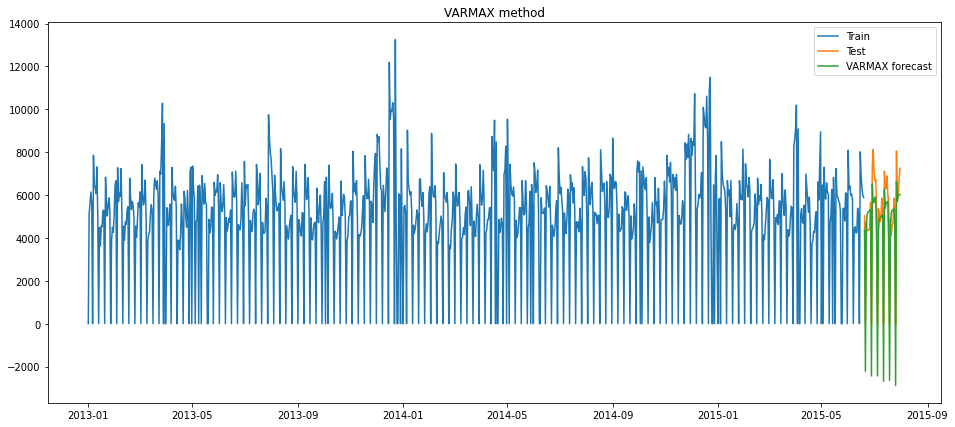

In [387]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [388]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2307.68,15.33
0,VARMAX method,1302.53,13.42


## ARIMA Model

In [389]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -8288.389
Method:                       css-mle   S.D. of innovations           2432.078
Date:                Fri, 08 Apr 2022   AIC                          16592.778
Time:                        07:04:01   BIC                          16631.188
Sample:                    01-02-2013   HQIC                         16607.451
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.3594      0.280      1.283      0.200      -0.190       0.908
ar.L1.D.Sales    -0.8805      0.039    -22.526      0.000      -0.957      -0.804
ar.L2.D.Sales    -0.1158      0.044     

### Recover original time series

In [390]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

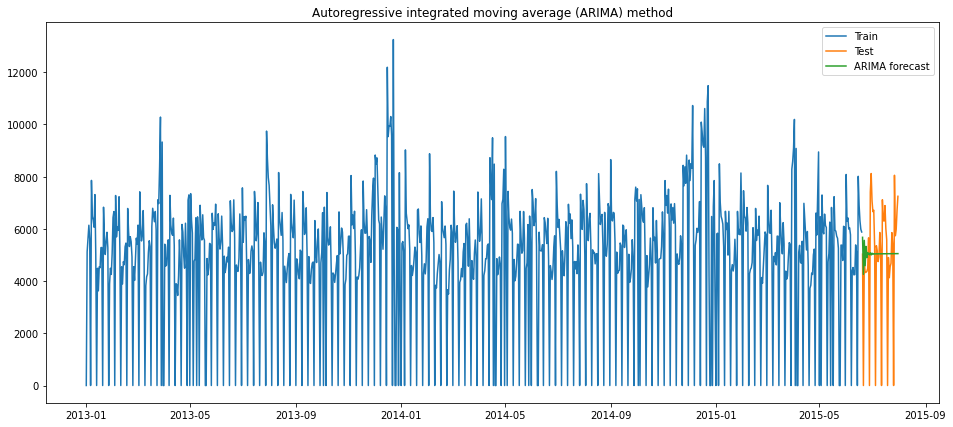

In [391]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [392]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2307.68,15.33
0,VARMAX method,1302.53,13.42
0,ARIMA method,2213.47,16.29


## SARIMA Model

In [393]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7772.829
Date:                           Fri, 08 Apr 2022   AIC                          15563.658
Time:                                   07:04:13   BIC                          15606.800
Sample:                               01-01-2013   HQIC                         15580.146
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7992      4.986     -0.160      0.873     -10.572       8.974
ar.L2          0.3259      1.001      0.326

### Recover original time series

In [394]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

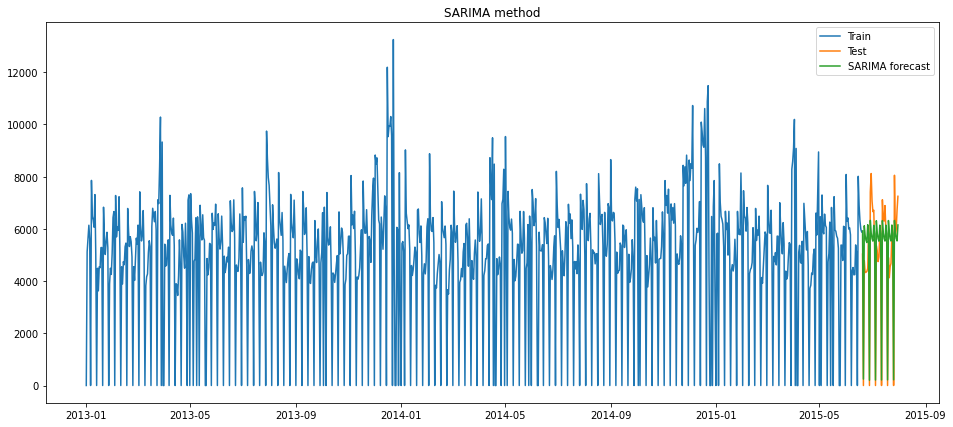

In [395]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [396]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2307.68,15.33
0,VARMAX method,1302.53,13.42
0,ARIMA method,2213.47,16.29
0,SARIMA method,972.31,16.39


## SARIMAX Model

In [397]:
train_data.shape

(900, 10)

In [398]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [399]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7270.563
Date:                           Fri, 08 Apr 2022   AIC                          14575.125
Time:                                   07:04:36   BIC                          14656.614
Sample:                               01-01-2013   HQIC                         14606.268
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear       55.1515      4.397     12.544      0.000      46.534      63.769
Promo          1686.9433     93.44

### Recover original time series

In [400]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

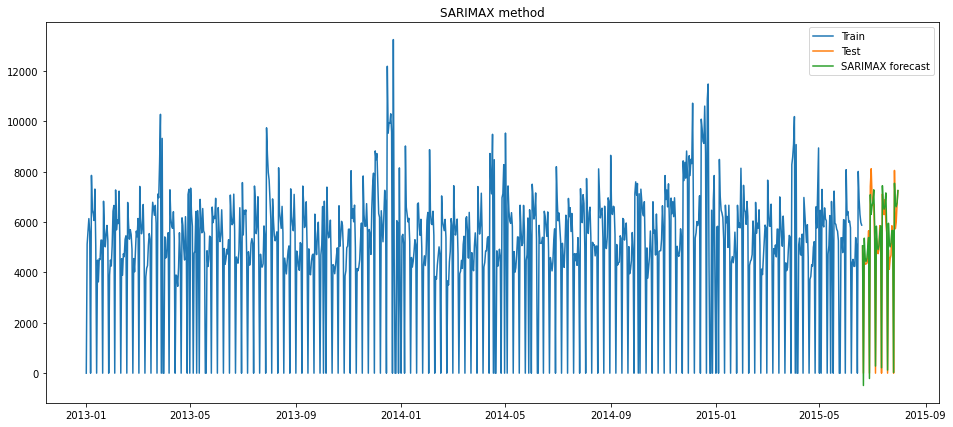

In [401]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [402]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2307.68,15.33
0,VARMAX method,1302.53,13.42
0,ARIMA method,2213.47,16.29
0,SARIMA method,972.31,16.39
0,SARIMAX method,541.49,7.75


## Best Model is SARIMAX

## Impulse Response Function

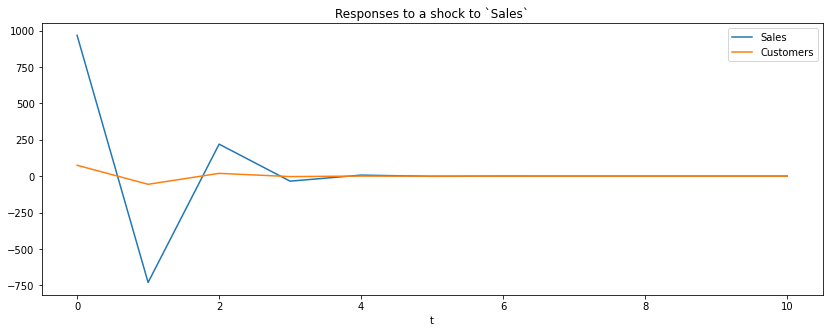

In [403]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [404]:
results_summary.append(results)
models_summary.append(models)

# Store 46

In [405]:
store = ts_master_ds[ts_master_ds['Store']==46]
store.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,
2013-01-01,46,1,0,0,0,0,1,1,3,1,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,1,1
2013-01-02,46,2,4016,582,1,0,0,1,3,1,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,2,1
2013-01-03,46,3,4177,553,1,0,0,1,3,1,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,3,1
2013-01-04,46,4,4125,569,1,0,0,1,3,1,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,4,1
2013-01-05,46,5,4848,651,1,0,0,0,3,1,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct",1,5,1


In [406]:
store.shape

(758, 20)

In [407]:
## Removing columns which has same values in all rows

col2drop = []
for i in store.columns :
    if store[i].nunique() == 1 :
        col2drop.append(i)
        
        
store.drop(columns=col2drop,inplace=True)

In [408]:
store.shape

(758, 10)

In [409]:
# Check if any date/row is missing from dataset, if any data is missing we will impute them with corresponding day 
# from last year, for eg, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data

start = store.index.min()
end = store.index.max()
missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
missing_data = missing_data[missing_data == True]

if len(missing_data) > 0 :
  print("Data for", len(missing_data),"days is missing")

  print("Handling missing data")
  ds = missing_data.reset_index()
  ds['New date'] = ds['index'] - pd.DateOffset(years=1)
  ds.set_index('New date',inplace=True)
  ds.drop(columns=[0],inplace=True)

  ds2 = store[store.index.isin(ds.index)]

  ds = ds.sort_index()
  ds2 = ds2.sort_index()

  final_ds = pd.concat([ds,ds2],axis=1)
  final_ds.set_index('index',inplace=True)

  store = pd.concat([store,final_ds])
  store = store.sort_index()

  missing_data = store.reindex(pd.date_range(start, end)).isnull().all(1)
  missing_data = missing_data[missing_data == True]

  print("After handling, Data for", len(missing_data),"days is missing")

else :
  print("No Data missing")

Data for 184 days is missing
Handling missing data
After handling, Data for 0 days is missing


## Plot Sales data

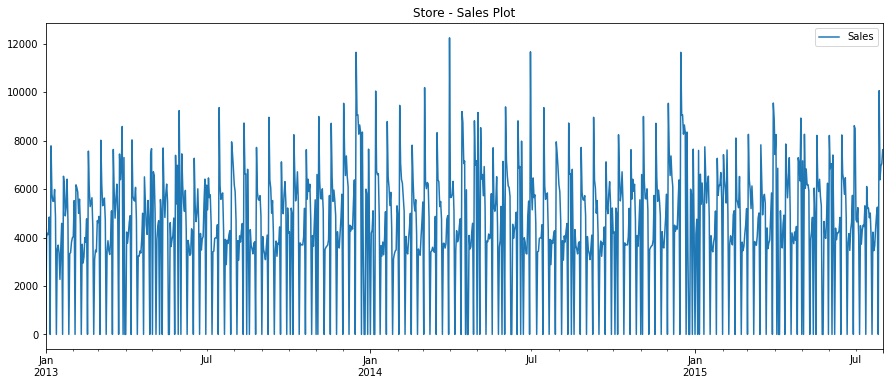

In [410]:
store['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store - Sales Plot')
plt.show(block=False)

## Time series Decomposition

### Additive seasonal decomposition

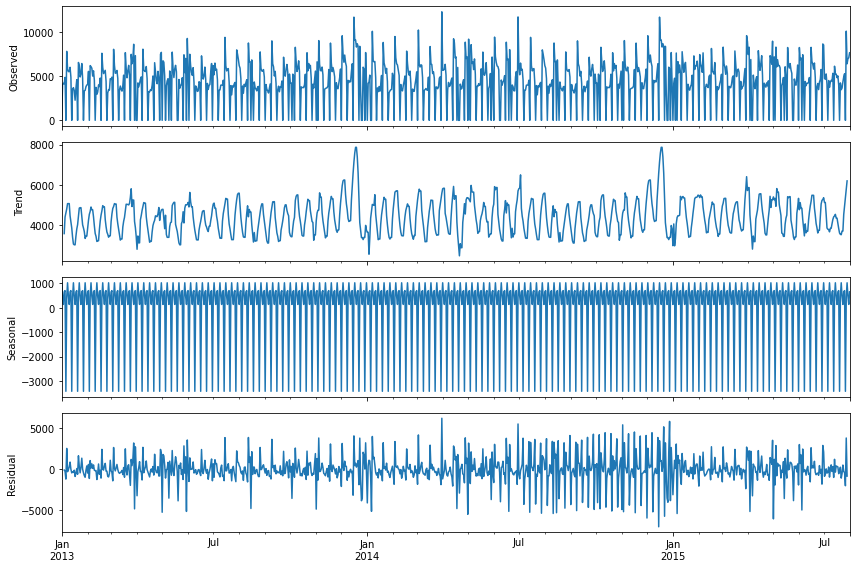

In [411]:
from pylab import rcParams
import statsmodels.api as sm

try :
  rcParams['figure.figsize'] = 12, 8
  decomposition = sm.tsa.seasonal_decompose(store['Sales'], model='additive') # additive seasonal index
  fig = decomposition.plot()
  plt.show()
except :
  print("Could not plot Additive Seasonal Decomposition plot")

## Stationarity vs non-stationary time series

### Augmented Dickey-Fuller (ADF) test

In [412]:
# ADF Test on each column
for name, column in store.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.3456
 No. Lags Chosen       = 7
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.2861
 No. Lags Chosen       = 20
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Lev

In [413]:
# 1st difference
store_diff = store.diff().dropna()

In [414]:
# ADF Test on each column
for name, column in store_diff.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -11.72
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.2213
 No. Lags Chosen       = 19
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Lev

All Columns are now stationary

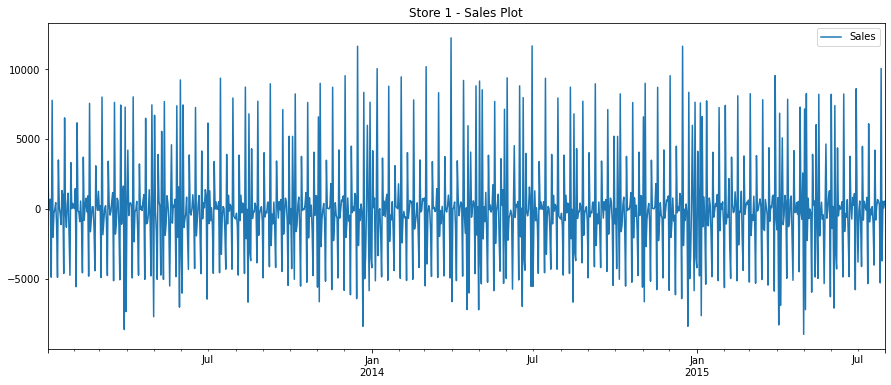

In [415]:
store_diff['Sales'].plot(figsize=(15, 6))
plt.legend(loc='best')
plt.title('Store 1 - Sales Plot')
plt.show(block=False)

Our Data is now Stationary

## Autocorrelation function (ACF)

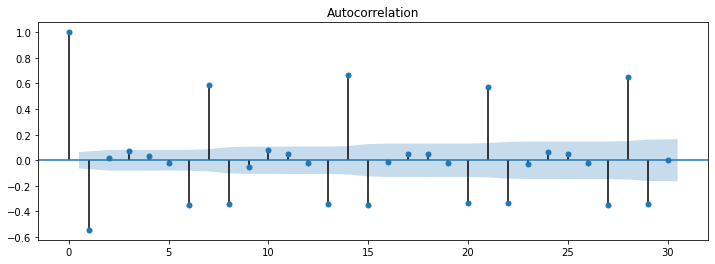

In [416]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use MA = 2 as per above PACF plot

## Partial autocorrelation function (PACF)

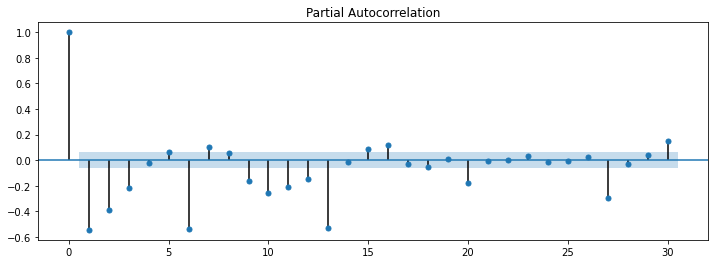

In [417]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(store_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

We will use AR = 4 as per above PACF plot

In [418]:
AR = 4
MA = 2
D = 1  # as only 1 level differencing was needed to make data stationary

## Build and Evaluate time series forecast

## Train Test Split

- We will consider last 6 weeks data as test data

In [419]:
test_length = 42 # 6 weeks have 42 days
train_data = store[:-1*test_length]
test_data = store[-1*test_length:]

train_data_diff = store_diff[:-1*test_length]
test_data_diff = store_diff[-1*test_length:]

## VAR Model

In [420]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(AR,0), trend='n')
model_fit = model.fit()
print(model_fit.summary())
models = []
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                             VAR(4)   Log Likelihood              -13333.834
Date:                    Fri, 08 Apr 2022   AIC                          26705.668
Time:                            07:04:42   BIC                          26796.892
Sample:                        01-02-2013   HQIC                         26740.518
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1029.32, 741.89   Jarque-Bera (JB):        86.87, 121.23
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.21, 1.15   Skew:                     -0.76, -0.57
Prob(H) (two-sided):            0.11, 0.23   Kurtosis:                   3.01, 4.39


### Recover original time series

In [421]:
forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(store_diff.index.min(), store_diff.index.max())['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

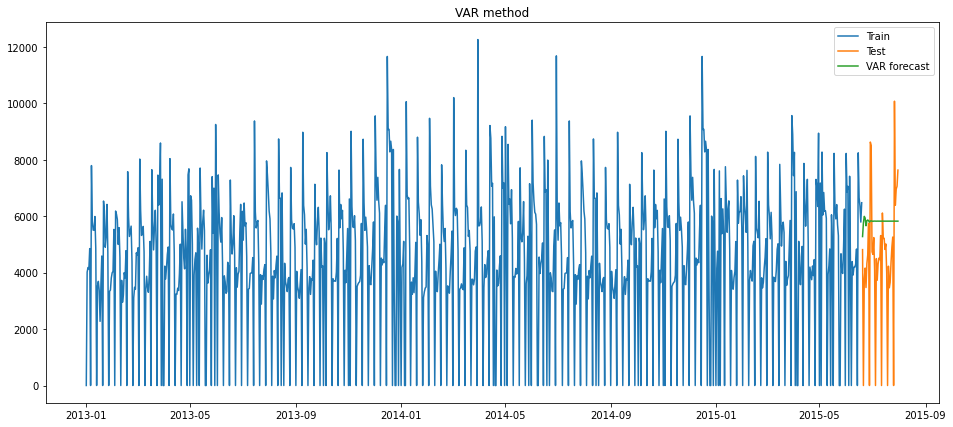

In [422]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VAR forecast')
plt.legend(loc='best')
plt.title('VAR method')
plt.show()

In [423]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

results = pd.DataFrame({'Method':['VAR method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2666.26,28.92


## Cointegration - Johansen Test

In [424]:
joh_model1 = coint_johansen(store_diff,-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

   max_eig_stat    trace_stat
0   8683.110241  14733.037156
1   1325.616109   6049.926915
2    966.323129   4724.310806
3    838.939019   3757.987677
4    809.001703   2919.048658
5    691.336726   2110.046955
6    576.992918   1418.710229
7    418.031904    841.717311
8    234.826136    423.685407
9    188.859271    188.859271 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[57.7954 61.0404 67.6415]
 [51.8528 54.9629 61.3449]
 [45.893  48.8795 55.0335]
 [39.9085 42.7679 48.6606]
 [33.9271 36.6301 42.2333]
 [27.916  30.4428 35.7359]
 [21.837  24.1592 29.0609]
 [15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[212.4721 219.4051 232.8291]
 [173.2292 179.5199 191.8122]
 [137.9954 143.6691 154.7977]
 [106.7351 111.7797 121.7375]
 [ 79.5329  83.9383  92.7136]
 [ 56.2839  60.0627  67.6367]
 [ 37.0339  40.1749  46.5716]
 [ 21.7781  24.2761  29.5147]
 [ 10.4741  12.3212  16.364 ]
 [  2.9762   4.1296   6.9406]] 

Note that the test-statistics at each stage for both trace test and max eigen test are greater than the test statistic at 5% significance level. 
SO THE RANK OF THE MATRIX IS 2 => NO COINTEGRATION => VAR IN DIFFERENCE IS SUFFICIENT FOR THESE 10 SERIES.

## VARMAX Model 

In [425]:
train_data_diff.shape

(899, 10)

In [426]:
train_data_diff.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Month,Day,WeekOfYear
2013-01-02,1.0,4016.0,582.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0
2013-01-03,1.0,161.0,-29.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-04,1.0,-52.0,16.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2013-01-05,1.0,723.0,82.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0
2013-01-06,1.0,-4848.0,-651.0,-1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [427]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data_diff[exog_columns]

exog.shape

(899, 8)

In [428]:

model = sm.tsa.VARMAX(train_data_diff[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
model_fit = model.fit(maxiter=1000, disp=False)
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                        VARMAX(1,1)   Log Likelihood              -12742.472
Date:                    Fri, 08 Apr 2022   AIC                          25538.944
Time:                            07:05:10   BIC                          25668.579
Sample:                        01-02-2013   HQIC                         25588.468
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):             1774.31, 497.00   Jarque-Bera (JB):          1.03, 59.32
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.60, 0.00
Heteroskedasticity (H):         1.02, 1.25   Skew:                      -0.08, 0.50
Prob(H) (two-sided):            0.84, 0.06   Kurtosis:                   2.96, 3.77


### Recover original time series

In [429]:
exog_test = test_data_diff[exog_columns]

forecast = test_data_diff.copy()
forecast['pred_diff'] = model_fit.predict(forecast.index.min(), forecast.index.max(), exog=exog_test)['Sales']
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


### Plot train, test and forecast

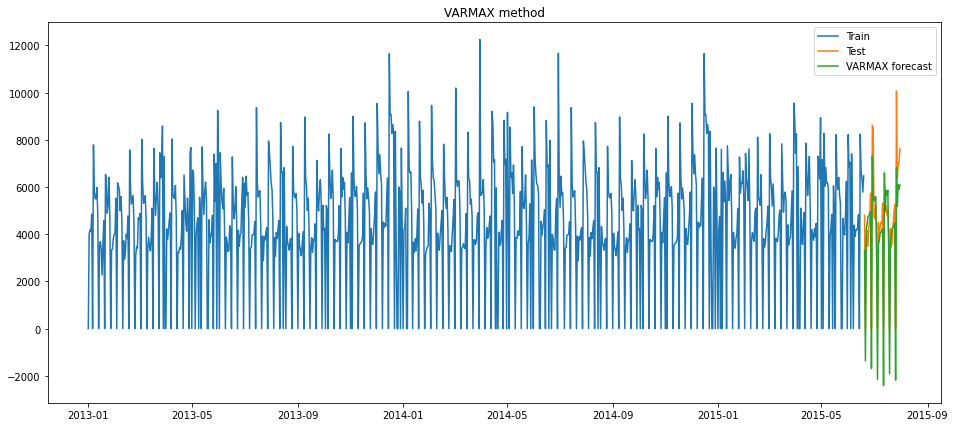

In [430]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX method')
plt.show()

### Calculate RMSE and MAPE

In [431]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['VARMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2666.26,28.92
0,VARMAX method,1240.64,15.24


## ARIMA Model

In [432]:
model = ARIMA(train_data["Sales"], order=(AR, D, MA))
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  899
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -8302.141
Method:                       css-mle   S.D. of innovations           2470.244
Date:                Fri, 08 Apr 2022   AIC                          16620.282
Time:                        07:05:11   BIC                          16658.692
Sample:                    01-02-2013   HQIC                         16634.956
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.4919      0.322      1.528      0.127      -0.139       1.123
ar.L1.D.Sales    -0.8662      0.050    -17.492      0.000      -0.963      -0.769
ar.L2.D.Sales    -0.0185      0.044     

### Recover original time series

In [433]:
forecast = test_data.copy()
forecast['pred_diff'] = model_fit.predict(test_data.index.min(), test_data.index.max())
forecast['pred'] = forecast['pred_diff'].cumsum()
forecast['pred'] = forecast['pred'].add(train_data['Sales'][-1])

### Plot train, test and forecast

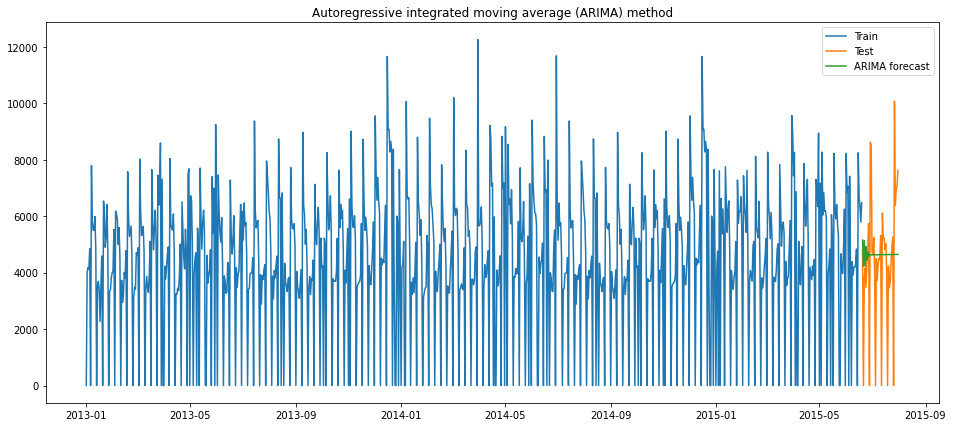

In [434]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():],  label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

### Calculate RMSE and MAPE

In [435]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['ARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2666.26,28.92
0,VARMAX method,1240.64,15.24
0,ARIMA method,2304.45,17.81


## SARIMA Model

In [436]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7)) 
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7970.405
Date:                           Fri, 08 Apr 2022   AIC                          15958.810
Time:                                   07:05:24   BIC                          16001.952
Sample:                               01-01-2013   HQIC                         15975.298
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9786      0.127      7.685      0.000       0.729       1.228
ar.L2          0.1838      0.051      3.632

### Recover original time series

In [437]:
forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max())


### Plot train, test and forecast

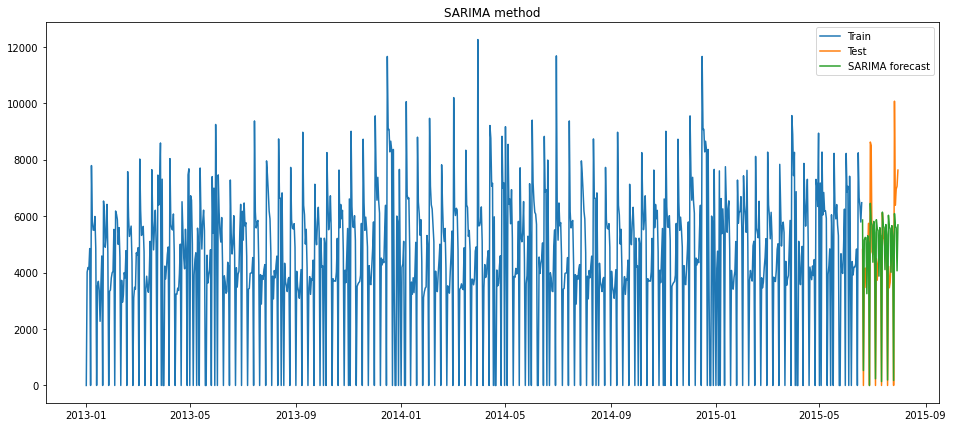

In [438]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA method')
plt.show()

### Calculate RMSE and MAPE

In [439]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMA method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2666.26,28.92
0,VARMAX method,1240.64,15.24
0,ARIMA method,2304.45,17.81
0,SARIMA method,1376.92,23.87


## SARIMAX Model

In [440]:
train_data.shape

(900, 10)

In [441]:
exog_columns = list(set(train_data.columns) - set(['Sales','Customers']))

exog = train_data[exog_columns]

exog.shape

(900, 8)

In [442]:
model = SARIMAX(train_data['Sales'], order=(AR, D, MA), seasonal_order=(1, 1, 1, 7),exog=exog)
model_fit = model.fit()
print(model_fit.summary())
models.append(model_fit)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Statespace Model Results                                
Dep. Variable:                             Sales   No. Observations:                  900
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 7)   Log Likelihood               -7407.368
Date:                           Fri, 08 Apr 2022   AIC                          14848.735
Time:                                   07:05:45   BIC                          14930.224
Sample:                               01-01-2013   HQIC                         14879.878
                                    - 06-19-2015                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
WeekOfYear        0.3185     13.566      0.023      0.981     -26.271      26.908
Promo          2972.9926    157.96

### Recover original time series

In [443]:
exog_test = test_data[exog_columns]

forecast = test_data.copy()
forecast['pred'] = model_fit.predict(test_data.index.min(), test_data.index.max(),exog=exog_test)


### Plot train, test and forecast

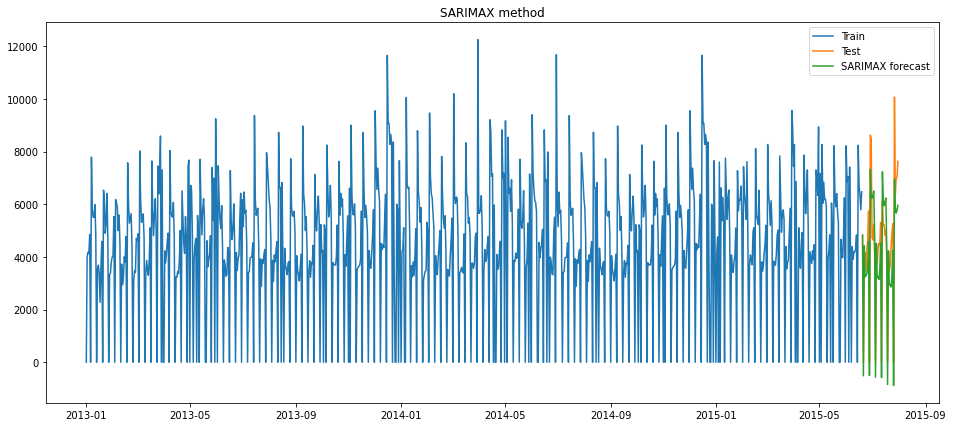

In [444]:
plt.figure(figsize=(16,7))
plt.plot(train_data['Sales'], label='Train')
plt.plot(test_data['Sales'], label='Test')
plt.plot(forecast['pred'][test_data.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

### Calculate RMSE and MAPE

In [445]:
rmse = np.sqrt(mean_squared_error(test_data['Sales'], forecast['pred'][test_data.index.min():])).round(2)
test_data_temp = test_data[test_data['Sales']!=0]
mape = np.round(np.mean(np.abs(test_data_temp['Sales']-forecast['pred'][test_data_temp.index.min():])/test_data_temp['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,VAR method,2666.26,28.92
0,VARMAX method,1240.64,15.24
0,ARIMA method,2304.45,17.81
0,SARIMA method,1376.92,23.87
0,SARIMAX method,1142.74,19.40


## Best Model is VARMAX

## Impulse Response Function

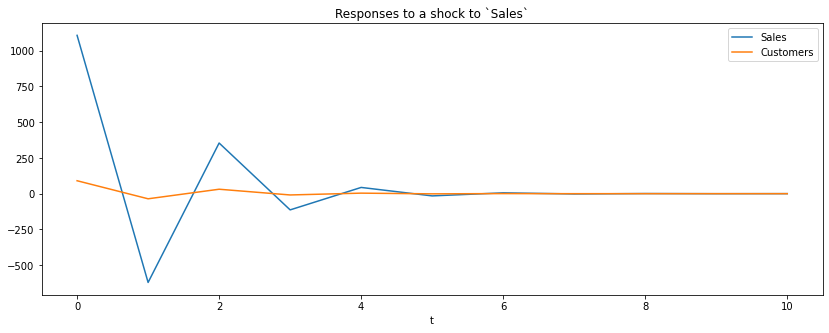

In [446]:
varmax_model = models[1]
ax = varmax_model.impulse_responses(10, orthogonalized=True).plot(figsize=(14,5))
ax.set(xlabel='t', title='Responses to a shock to `Sales`');

In [447]:
results_summary.append(results)
models_summary.append(models)

# Finally, We are done with trying all different kinds of AR models for each Store : 1, 3, 8, 9, 13, 25, 29, 31 and 46

- We found out that SARIMAX and VARMAX models are performing well for most of the Stores.
- We also predicted Sales for next 6 Weeks (42 Days) and compared the prediction with real sales using evaluation matrix like Root Mean Square Error (RMSE) and Mean Absolute Percentage Error (MAPE)
- We have tried following models for each stores :
  1.   VAR Model
  2.   VARMAX Model
  3.   ARIMA Model
  4.   SARIMA Model
  5.   SARIMAX Model

<br></br>
Points to be Noted :
  *   For Seasonal Models, we have considered seasonal order as (1,1,1,7), 7 because, as per Additive Seasonal Decomposition plot, we could see that sales are showing a seasonality of 7 days (a week) & S_AR = S_D = S_MA = 1 because it gives the best result after trying various combinations.
  *   For VARMAX Models, I have taken AR = 1 and MA = 1, because this gave me the best results after trying various combination.
  *   For few Models, I have used custom AR and MA values because I was getting error (Model couldn't diverge) with derived AR,MA values from PACF and ACF plots.
  *   For calculating MAPE, I have considered only those rows where Sales was non-Zero, because if I tried to calculate MAPE with rows having Zero sales, it was giving Infinite value.
  *   For Store 13, 25 and 46, few day's data was missing, I have imputed them with corresponding day's data from previous year. For Example, if 2015-06-04 day data is missing, we will impute with 2014-06-04 day data.






In [448]:
store_no = [1, 3, 8, 9, 13, 25, 29, 31, 46]
best_models = pd.DataFrame(columns=['Store','Method','RMSE','MAPE'])
for (i,j) in zip(results_summary,store_no) :
  df = i.sort_values(by='MAPE')[:1]
  df['Store'] = j
  best_models = pd.concat([best_models,df])


In [449]:
best_models

,Store,Method,RMSE,MAPE
0,1,SARIMAX method,379.70,6.85
0,3,SARIMAX method,1003.07,10.80
0,8,SARIMAX method,696.89,7.76
0,9,VARMAX method,1291.23,12.25
0,13,SARIMAX method,1191.93,15.28
0,25,VARMAX method,2024.33,11.15
0,29,VARMAX method,1409.14,15.35
0,31,SARIMAX method,541.49,7.75
0,46,VARMAX method,1240.64,15.24


The above Table shows the Best Model for each Store with their respective accuracy in terms of RMSE and MAPE